# Masked Auto Encoder Training

This notebook is used to to train the masked auto encoder model for experimental purposes.

In [26]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [27]:
# Add the parent directory to the path
import sys  
sys.path.insert(1, '../')

In [ ]:
import os
import numpy as np
import webdataset as wds
from dotenv import load_dotenv

import torch
from torch.utils.data import DataLoader
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import LearningRateMonitor, ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger

import model.transforms as T
from model.aermae import AerMAE
from model.aegis import AeGISUpernet, AeGISFormer
from model.lightning.aermae_bolt import AerMAEBolt
from model.lightning.aegis_bolt import AeGISBolt

In [4]:
load_dotenv()

True

## Load Dataset

In [5]:
root = os.getenv('DATA_ROOT')

In [29]:
root = 'F:/USGS/EROS' #'/mnt/f/USGS/EROS'

In [30]:
train_loc = f'file:{root}' + '/poc2/aerpoc-train-{000000..000010}.tar'
val_loc = f'file:{root}' + '/poc2/aerpoc-val-{000000..000004}.tar'
test_loc = f'file:{root}' + '/poc2/aerpoc-test-{000000..000004}.tar'

In [31]:
tune_train_loc = 'file:F:/USGS/NCIR/finetune/train-{000000..000002}.tar'
tune_val_loc = 'file:F:/USGS/NCIR/finetune/val-{000000..000000}.tar'
tune_test_loc = 'file:F:/USGS/NCIR/finetune/test-{000000..000000}.tar'

In [32]:
#mu = [0.6577]
#sigma = [0.1994]
#lens = [44_641, 14_823, 15_112]

#mu = [0.6507]
#sigma = [0.2076]
#lens = [401_769, 133_407, 136_008]

mu = [0.6528]
sigma = [0.2053]
lens = [165_000, 75_000, 75_000]

In [11]:
def calculate_stats(ds) -> list[float]:
    sum_ = 0.0
    sum_sq = 0.0
    count = 0

    shapes = set()

    for img, _ in iter(ds):
        count += 1
        img = img.view(-1)
        sum_ += img.sum()
        sum_sq += (img ** 2).sum()
        shapes.add(tuple(img.size()))

    pxl = count * 224 * 224
    mu = sum_ / pxl
    sigma = ((sum_sq / pxl) - (mu ** 2)).sqrt()

    return [mu], [sigma], shapes, count

ds_tmp = (wds.WebDataset(train_loc, shardshuffle=False)
    .decode("pil")
    .to_tuple("jpg", "json")
    .map(T.AerMAETransforms(is_train=True, mu=[0], sigma=[1])))

mu, sigma, shapes, count = calculate_stats(ds_tmp)

ds_tmp.close()
del ds_tmp

print(mu, sigma, shapes, count)
# tensor(0.6690) tensor(0.1652)

[tensor(0.6528)] [tensor(0.2053)] {(50176,)} 165000


In [33]:
ds_train = (wds.WebDataset(train_loc, shardshuffle=True)
      .shuffle(10_000)
      .decode("pil")
      .to_tuple("jpg", "json")
      .with_length(lens[0])
      .map(T.AerMAETransforms(is_train=True, mu=mu, sigma=sigma)))

ds_val = (wds.WebDataset(val_loc, shardshuffle=False)
      .decode("pil")
      .to_tuple("jpg", "json")
      .with_length(lens[1])
      .map(T.AerMAETransforms(is_train=False, mu=mu, sigma=sigma)))

ds_test = (wds.WebDataset(test_loc, shardshuffle=False)
      .decode("pil")
      .to_tuple("jpg", "json")
      .with_length(lens[2])
      .map(T.AerMAETransforms(is_train=False, mu=mu, sigma=sigma)))

In [34]:
ds_tune_train = (wds.WebDataset(tune_train_loc, shardshuffle=True)
      .shuffle(10_000)
      .decode("pil")
      .to_tuple("jpg", "json")
      .with_length(45_000)
      .map(T.AeGISTransforms(is_train=True, mu=mu, sigma=sigma)))

ds_tune_val = (wds.WebDataset(tune_val_loc, shardshuffle=False)
      .decode("pil")
      .to_tuple("jpg", "json")
      .with_length(15_000)
      .map(T.AeGISTransforms(is_train=False, mu=mu, sigma=sigma)))

ds_tune_test = (wds.WebDataset(tune_test_loc, shardshuffle=False)
      .decode("pil")
      .to_tuple("jpg", "json")
      .with_length(15_000)
      .map(T.AeGISTransforms(is_train=False, mu=mu, sigma=sigma)))

In [ ]:
def get_count(ds):
    count = 0
    for _ in ds:
        count += 1

    return count

In [ ]:
val_len = get_count(ds_val)
test_len = get_count(ds_test)
print(val_len, test_len)

133407 136008


In [17]:
ds_train.close()
ds_val.close()
ds_test.close()

In [35]:
train_loader = DataLoader(ds_train, batch_size=16)#, num_workers=8, persistent_workers=True)
val_loader = DataLoader(ds_val, batch_size=16)#, num_workers=8, persistent_workers=True)
test_loader = DataLoader(ds_test, batch_size=16)

In [36]:
tune_train_loader = DataLoader(ds_tune_train, batch_size=8)#, num_workers=8, persistent_workers=True)
tune_val_loader = DataLoader(ds_tune_val, batch_size=8)#, num_workers=8, persistent_workers=True)
tune_test_loader = DataLoader(ds_tune_test, batch_size=8)

## Create MAE Model

In [37]:
mae = AerMAE(img_size=(224, 224),
             patch_size=8,
             enc_meta_dim=128,
             enc_dim=768,
             dec_meta_dim=128,
             dec_dim=512,
             enc_layers=6,
             dec_layers=4,
             enc_heads=16,
             dec_heads=16,
             ff_mul=4,
             mask_pct=0.75)

## Lightning Trainer

In [38]:
accum = 4
node = 1
gpu = 1
batches = 16
epochs = 25
lr = 1.5e-4 * batches * gpu * node * accum / 256

In [39]:
l_mae = AerMAEBolt(mae, lr=lr, warmup=5, epochs=epochs, accumulate_grad_batches=accum, norm_tgt=False, unmasked_weight=0.05)
#l_mae = torch.compile(l_mae)

In [ ]:
aegis = AeGISUpernet(768, l_mae.mae.encoder, inindex=[1, 3, 4, 5])

In [18]:
accum = 4
node = 1
gpu = 1
batches = 16
epochs = 25
lr = 1e-3 #* batches * gpu * node * accum / 256

In [ ]:
l_aeg = AeGISBolt(aegis, lr=lr, warmup=5, epochs=epochs, accumulate_grad_batches=accum)

In [42]:
accum = 4
node = 1
gpu = 1
batches = 16
epochs = 20
lr = 5e-4 * batches * gpu * node * accum / 256

In [43]:
l_aeg = AeGISBolt(aegis, lr=lr, warmup=5, epochs=epochs, accumulate_grad_batches=accum)

Single Epoch Trainer

In [26]:
for name, param in aegis.encoder.named_parameters():
    param.requires_grad = False

In [33]:
for name, param in aegis.encoder.named_parameters():
    param.requires_grad = True

In [44]:
# saves top-K checkpoints based on "val_loss" metric
val_checkpoint = ModelCheckpoint(
    save_top_k=1,
    monitor="val_loss_epoch",
    mode="min",
    dirpath="./checkpoint",
    filename="aegis-exp13-{epoch:02d}-{val_loss_epoch:.2f}",
)

lr_monitor = LearningRateMonitor(logging_interval='epoch')
logger = TensorBoardLogger("logs", name="AeGIS")

trainer = Trainer(max_epochs=epochs, precision=16, logger=logger, callbacks=[val_checkpoint, lr_monitor])#, accumulate_grad_batches=4)

c:\Users\micha\miniconda3\envs\aer_env\Lib\site-packages\lightning\fabric\connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(l_aeg, tune_train_loader, tune_val_loader)

In [15]:
# saves top-K checkpoints based on "val_loss" metric
val_checkpoint = ModelCheckpoint(
    save_top_k=1,
    monitor="val_loss_epoch",
    mode="min",
    dirpath="./checkpoint",
    filename="aermae-exp14-{epoch:02d}-{val_loss_epoch:.2f}",
)

lr_monitor = LearningRateMonitor(logging_interval='epoch')
logger = TensorBoardLogger("logs", name="AerMAE")

trainer = Trainer(max_epochs=epochs, precision=16, logger=logger, callbacks=[val_checkpoint, lr_monitor])#, accumulate_grad_batches=4)

c:\Users\micha\miniconda3\envs\aer_env\Lib\site-packages\lightning\fabric\connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(l_mae, train_loader, val_loader)

You are using a CUDA device ('NVIDIA GeForce RTX 3080') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
c:\Users\micha\miniconda3\envs\aer_env\Lib\site-packages\lightning\pytorch\callbacks\model_checkpoint.py:654: Checkpoint directory C:\Users\micha\OneDrive\Documents\GitHub\AerMAE\notebooks\checkpoint exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name | Type   | Params | Mode 
----------------------------------------
0 | mae  | AerMAE | 55.6 M | train
----------------------------------------
55.6 M    Trainable params
0         Non-trainable params
55.6 M    Total params
222.468   Total estimated model params size (MB)
223       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\micha\miniconda3\envs\aer_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.
c:\Users\micha\miniconda3\envs\aer_env\Lib\site-packages\lightning\pytorch\utilities\data.py:122: Your `IterableDataset` has `__len__` defined. In combination with multi-process data loading (when num_workers > 1), `__len__` could be inaccurate if each worker is not configured independently to avoid having duplicate data.


c:\Users\micha\miniconda3\envs\aer_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 0:   0%|          | 2/10313 [00:01<2:30:16,  1.14it/s, v_num=17, train_loss_step=3.490]

c:\Users\micha\miniconda3\envs\aer_env\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: cuDNN SDPA backward got grad_output.strides() != output.strides(), attempting to materialize a grad_output with matching strides... (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\MHA.cpp:676.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch 15:  17%|█▋        | 1788/10313 [03:27<16:30,  8.61it/s, v_num=17, train_loss_step=0.206, val_loss_step=0.285, val_loss_epoch=0.250, train_loss_epoch=0.247] 

In [30]:
trainer.fit(l_mae, train_loader, val_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name | Type   | Params | Mode
---------------------------------------
0 | mae  | AerMae | 41.7 M | eval
---------------------------------------
41.7 M    Trainable params
0         Non-trainable params
41.7 M    Total params
166.749   Total estimated model params size (MB)
0         Modules in train mode
103       Modules in eval mode


Epoch 80:   2%|▏         | 1/55 [00:00<00:27,  2.00it/s, v_num=33, train_loss_step=0.0218, val_loss_step=0.045, val_loss_epoch=0.0258, train_loss_epoch=0.0256]  


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [40]:
l_mae.load_state_dict(torch.load('checkpoint/aermae-exp14-epoch=14-val_loss_epoch=0.25.ckpt', weights_only=True)['state_dict'])

<All keys matched successfully>

In [20]:
l_aeg.load_state_dict(torch.load('checkpoint/aegis-exp9-epoch=24-val_loss_epoch=0.25.ckpt', weights_only=True)['state_dict'])

<All keys matched successfully>

In [17]:
import matplotlib.pyplot as plt

In [105]:
img, loc = next(iter(ds_train))
img_reg = T.denormalize(img.numpy(), mu=mu, sigma=sigma)

In [106]:
out, masks = mae(img.unsqueeze(0), loc.unsqueeze(0))
out_reg = out.detach().numpy()

In [110]:
out, masks = mae(img.unsqueeze(0), loc.unsqueeze(0), 0.1)
out_reg = out.detach().numpy()

In [35]:
out, masks = mae(img.unsqueeze(0), loc.unsqueeze(0))
out_reg = T.denormalize(out.detach().numpy(), mu=mu, sigma=sigma)

mem, masks, ids = mae.encoder(img.unsqueeze(0), loc.unsqueeze(0), 0.7)
mem_reg = T.denormalize(mem.detach().numpy(), mu=mu, sigma=sigma)

In [40]:
out, masks = mae(img.unsqueeze(0), loc.unsqueeze(0), 0.1)
out_reg = T.denormalize(out.detach().numpy(), mu=mu, sigma=sigma)

mem, masks, ids = mae.encoder(img.unsqueeze(0), loc.unsqueeze(0), 0.1)
mem_reg = T.denormalize(mem.detach().numpy(), mu=mu, sigma=sigma)

In [50]:
outs = aegis.encoder(img.unsqueeze(0), meta.unsqueeze(0))
outs = aegis.neck(outs)
outs = aegis.decoder(outs)

In [51]:
[out.shape for out in outs]
#outs.shape

[torch.Size([1, 112, 112])]

In [ ]:
img, meta, segment = next(iter(ds_tune_train))
img_reg = T.denormalize(img.numpy(), mu=mu, sigma=sigma)

out = aegis(img.unsqueeze(0), meta.unsqueeze(0))
print(torch.nn.functional.binary_cross_entropy_with_logits(out[0].squeeze(0), torch.from_numpy(segment)))
out = torch.nn.functional.sigmoid(out)
out = out.detach().numpy()

In [180]:
mem_reg.shape, out_reg.shape, img.shape

((1, 65, 512), (1, 256, 196), torch.Size([1, 224, 224]))

In [ ]:
from model.mae import mae_vit_base_patch16

chk = torch.load('../mae_pretrain_vit_base.pth')

model = mae_vit_base_patch16()

chk = chk['model']
state_dict = model.state_dict()
for k in ['head.weight', 'head.bias']:
    if k in chk and chk[k].shape != state_dict[k].shape:
        print(f"Removing key {k} from pretrained checkpoint")
        del chk[k]

model.load_state_dict(chk, strict=False)
model

In [107]:
from model.aermae import mae_loss


y = T.patch_images(img.unsqueeze(0), mae.patch_size)
#y = T.normalize_patches(y)
print(mae_loss(y, out, 1-masks, weight=0.05))

tensor(0.0268, grad_fn=<AddBackward0>)


In [111]:
from model.aermae import mae_loss


y = T.patch_images(img.unsqueeze(0), mae.patch_size)
#y = T.normalize_patches(y)
print(mae_loss(y, out, masks, weight=0.05))

tensor(0.3017, grad_fn=<AddBackward0>)


In [112]:
patches = 8

mask = masks.unsqueeze(-1).repeat(1, 1, patches**2)
mask = T.unpatch_images(mask, patches)
mask = mask.detach().numpy()[0]

yimg = T.unpatch_images(out, patches)
yimg = T.denormalize(yimg.detach().numpy()[0], mu=mu, sigma=sigma)

In [21]:
def visualize_segmentation(img, y_true, y_hat):
    _, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs = axs.flatten()

    ax = axs[0]
    ax.imshow(img, cmap='gray')
    ax.axis('off')
    ax.set_title('Original')

    ax = axs[1]
    ax.imshow(y_true, cmap='gray')
    ax.axis('off')
    ax.set_title('Segmentation')

    ax = axs[2]
    ax.imshow(y_hat, cmap='gray')
    ax.axis('off')
    ax.set_title('Prediction')

    plt.tight_layout()
    plt.show()

In [22]:
def visualize_prediction(y_true, y_hat, mask):
    _, axs = plt.subplots(2, 3, figsize=(12, 8))
    axs = axs.flatten()

    ax = axs[0]
    ax.imshow(y_true, cmap='gray', vmin=0, vmax=1)
    ax.axis('off')
    ax.set_title('Original')

    ax = axs[1]
    ax.imshow(y_true * (1 - mask), cmap='gray', vmin=0, vmax=1)
    ax.axis('off')
    ax.set_title('Retained')

    ax = axs[2]
    ax.imshow(y_hat * mask, cmap='gray', vmin=0, vmax=1)
    ax.axis('off')
    ax.set_title('Semi-Reconstruct')

    ax = axs[3]
    ax.imshow(y_hat, cmap='gray', vmin=0, vmax=1)
    ax.axis('off')
    ax.set_title('Reconstruct')

    ax = axs[4]
    ax.imshow(y_true * (1 - mask) + y_hat * mask, cmap='gray', vmin=0, vmax=1)
    ax.axis('off')
    ax.set_title('Reconstruct + Retained')

    axs[5].axis('off')

    plt.tight_layout()
    plt.show()

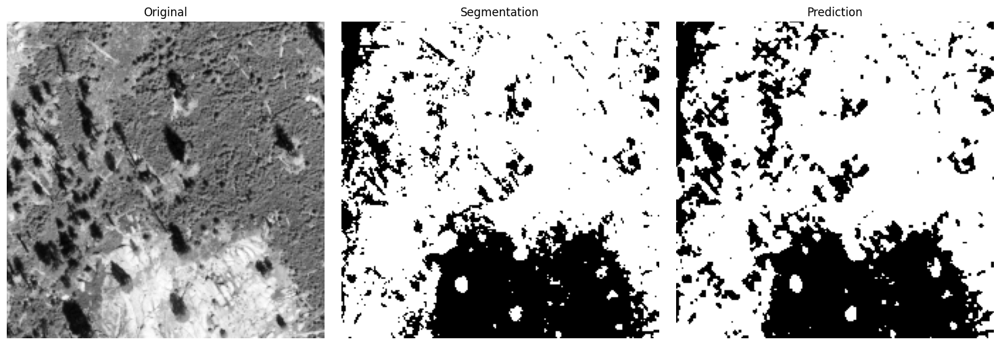

In [44]:
visualize_segmentation(img_reg[0], segment, np.round(out[0].squeeze(0)).astype(int))

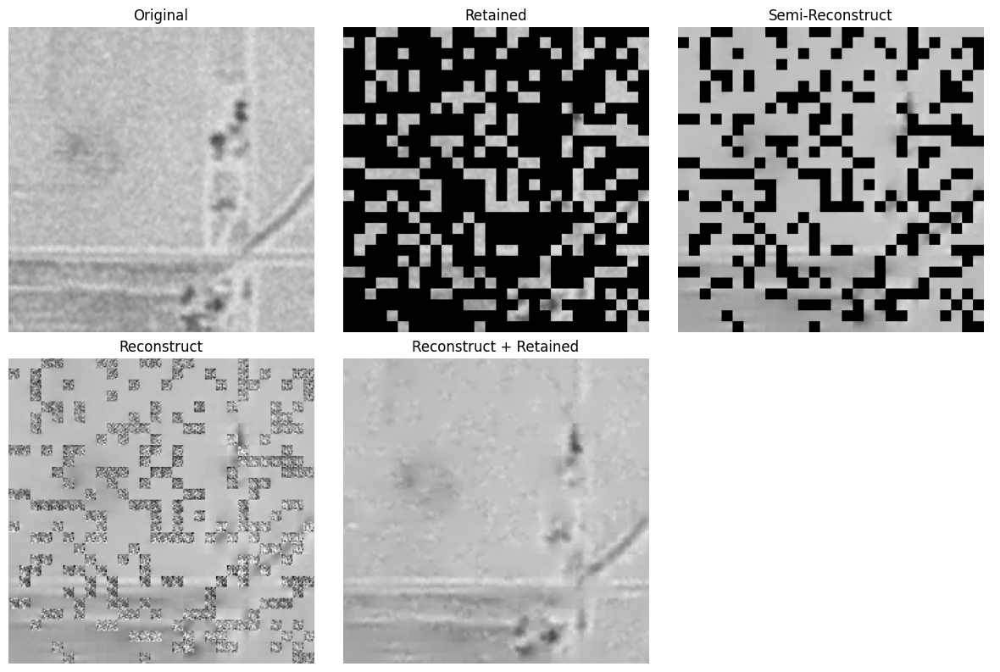

In [55]:
visualize_prediction(img_reg[0], yimg, mask)

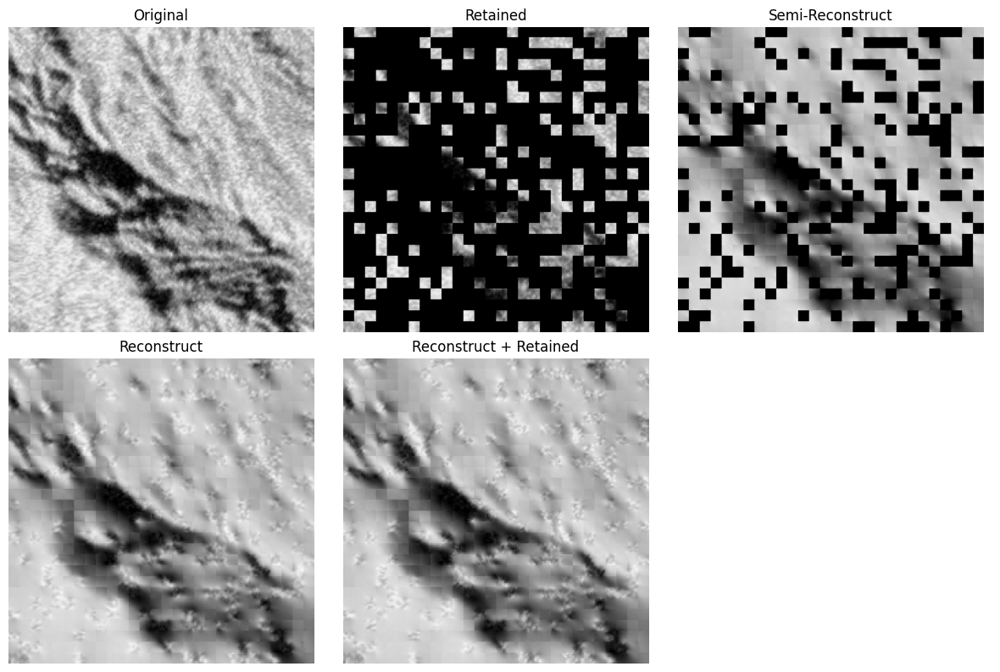

In [109]:
visualize_prediction(img_reg[0], yimg, mask)

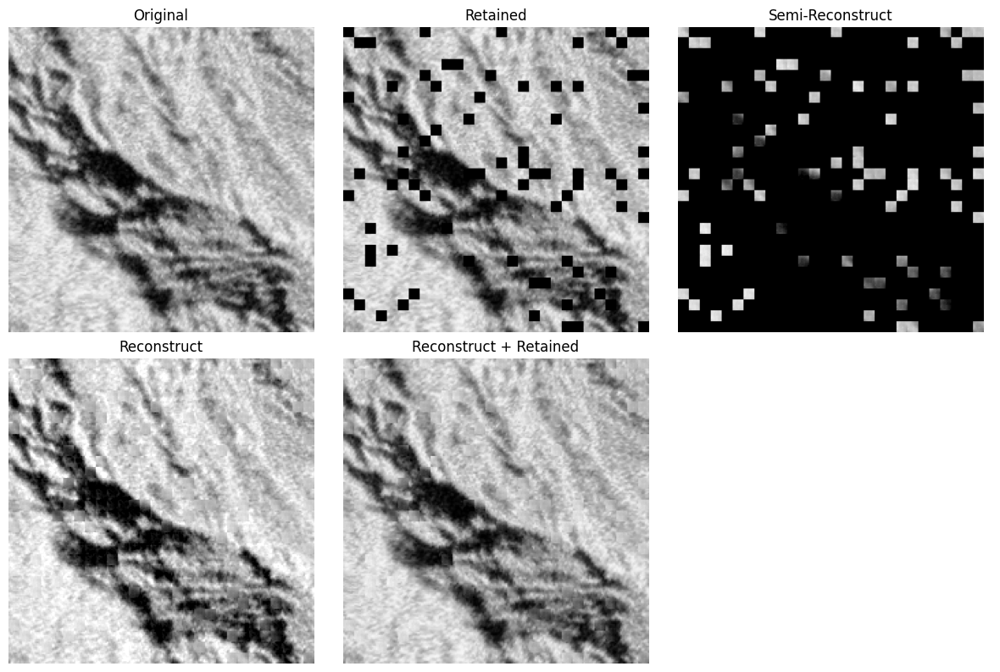

In [113]:
visualize_prediction(img_reg[0], yimg, mask)

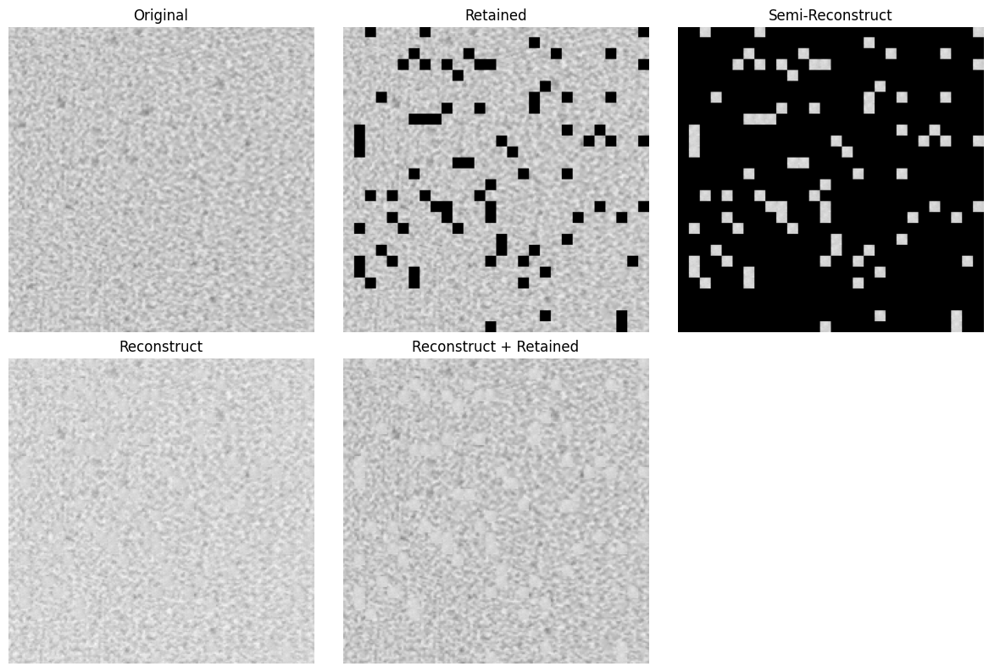

In [37]:
visualize_prediction(img_reg[0], yimg, mask)

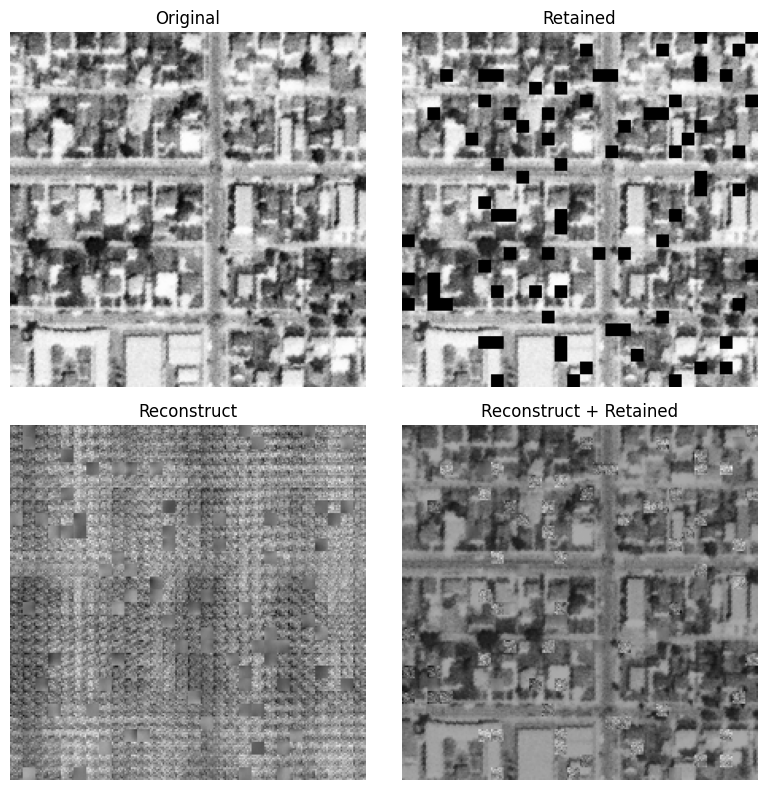

In [42]:
visualize_prediction(img_reg[0], yimg, mask)

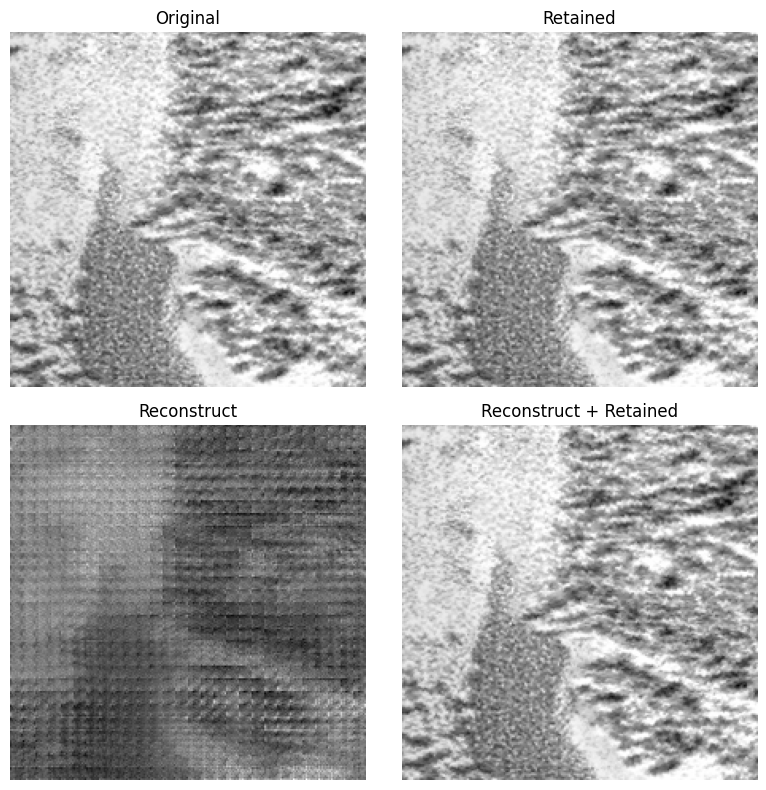

In [52]:
visualize_prediction(img_reg[0], yimg, mask)

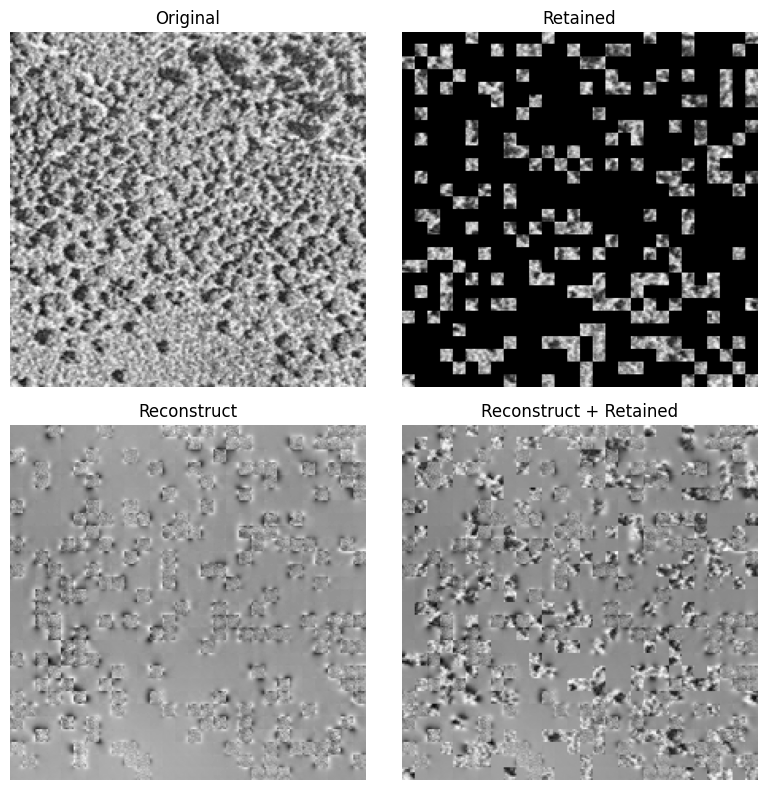

In [31]:
visualize_prediction(img_reg[0], yimg, mask)

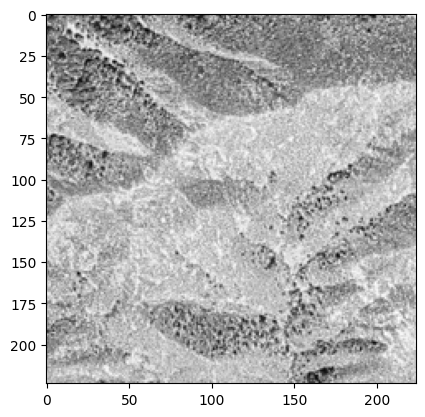

In [39]:
plt.imshow(img_reg[0], cmap='gray')#, vmin=-1, vmax=1)

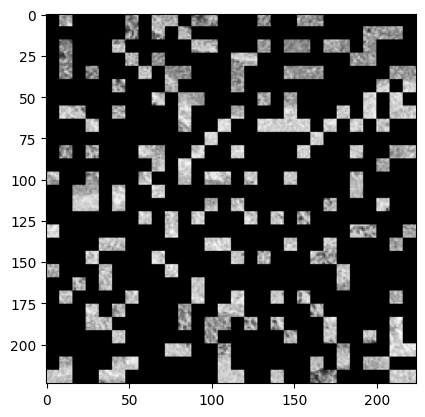

In [40]:
plt.imshow(img_reg[0] * (1 - mask), cmap='gray')

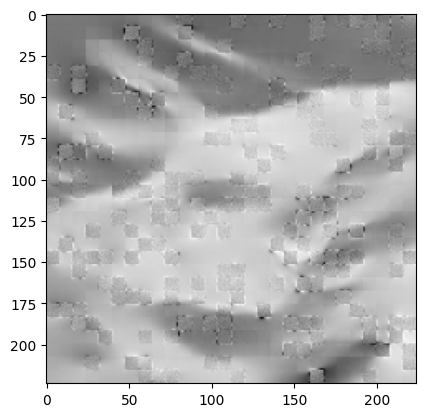

In [57]:
plt.imshow(yimg, cmap='gray')

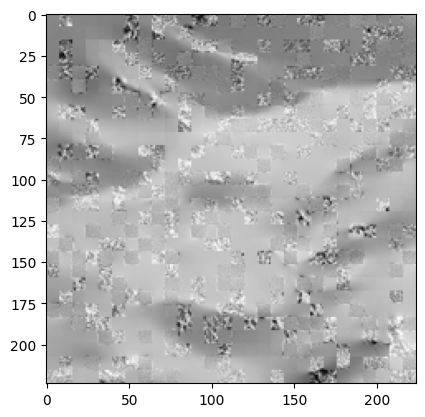

In [58]:
plt.imshow(img_reg[0] * (1 - mask) + yimg * mask, cmap='gray')

In [69]:
mask = masks.unsqueeze(-1).repeat(1, 1, 8**2)
mask = T.unpatch_images(mask, 8)
mask = mask.detach().numpy()[0]

yimg = T.unpatch_images(out, 8)
yimg = T.denormalize(yimg.detach().numpy()[0], mu=mu, sigma=sigma)

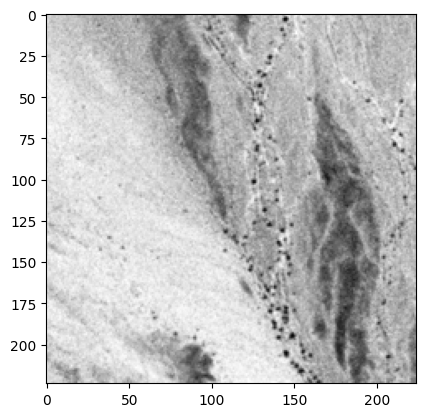

In [70]:
plt.imshow(img_reg[0], cmap='gray')

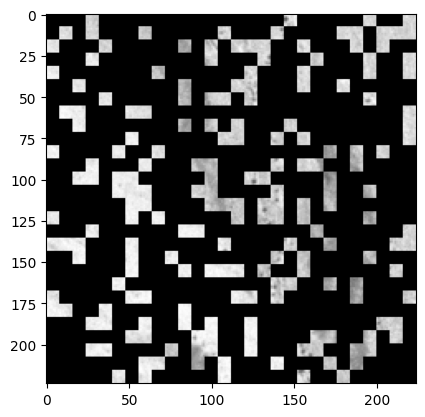

In [71]:
plt.imshow(img_reg[0] * (1 - mask), cmap='gray')

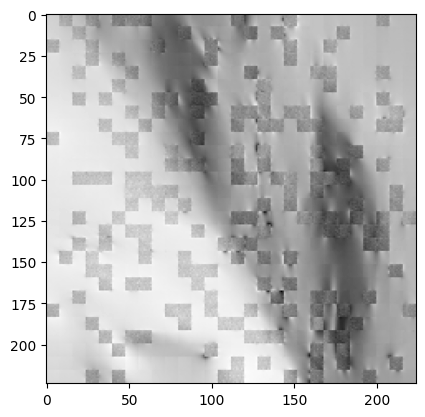

In [72]:
plt.imshow(yimg, cmap='gray')

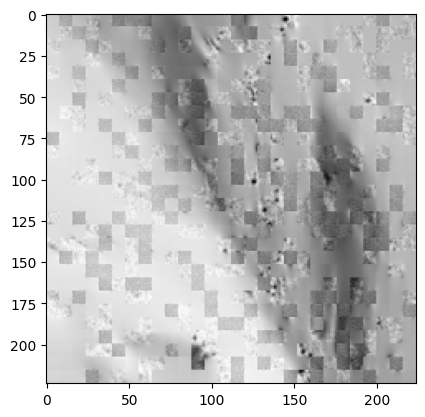

In [73]:
plt.imshow(img_reg[0] * (1 - mask) + yimg * mask, cmap='gray')

In [33]:
mask = masks.unsqueeze(-1).repeat(1, 1, 8**2)
mask = T.unpatch_images(mask, 8)
mask = mask.detach().numpy()[0]

yimg = T.unpatch_images(out, 8)
yimg = T.denormalize(yimg.detach().numpy()[0], mu=mu, sigma=sigma)

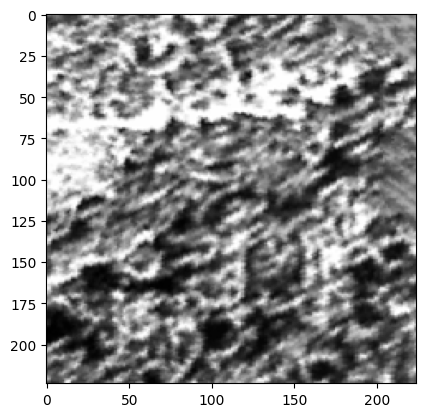

In [34]:
plt.imshow(img_reg[0], cmap='gray')

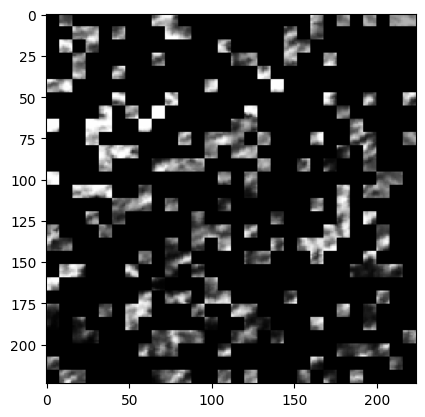

In [35]:
plt.imshow(img_reg[0] * (1 - mask), cmap='gray')

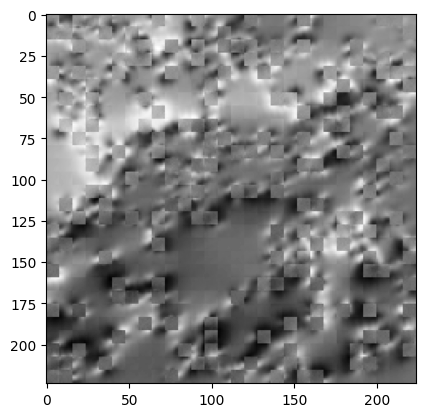

In [36]:
plt.imshow(yimg, cmap='gray')

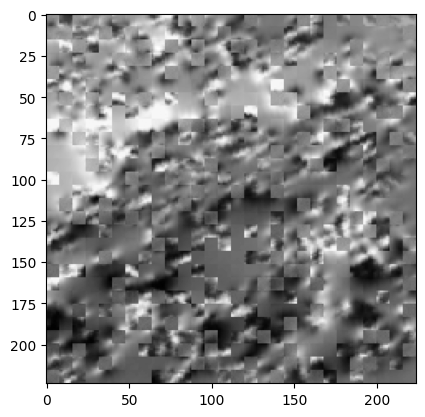

In [37]:
plt.imshow(img_reg[0] * (1 - mask) + yimg * mask, cmap='gray')

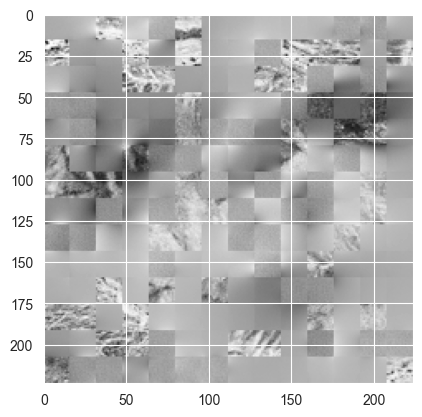

In [157]:
plt.imshow(T.unpatch_images(torch.where(masks.unsqueeze(-1).repeat(1, 1, 256) == 1, out, y)).detach()[0], cmap='gray')

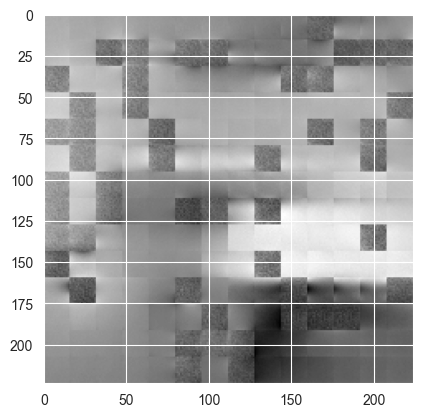

In [164]:
plt.imshow(T.unpatch_images(out).detach()[0], cmap='gray')

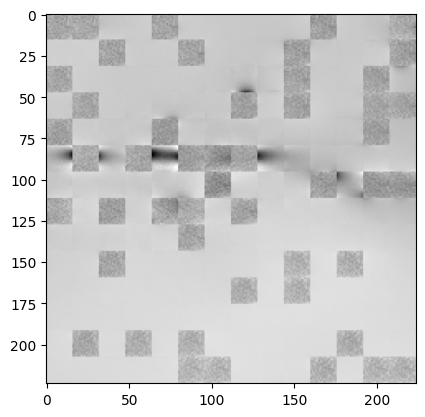

In [121]:
plt.imshow(T.unpatch_images(out).detach()[0], cmap='gray')

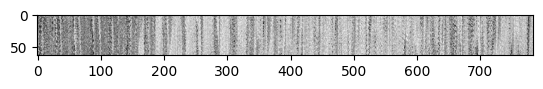

In [65]:
plt.imshow(y.detach()[0].T, cmap='gray')

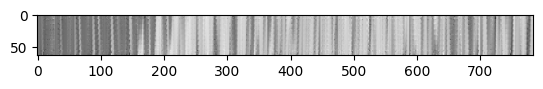

In [64]:
plt.imshow(out.detach()[0].T, cmap='gray')

## Outline Error Heatmap

In [23]:
def skip_to_batch(ds, batch):
    it = iter(ds)

    for i in range(batch):
        img, meta = next(it)

    return img, meta

In [ ]:
# TODO: load up the tile shp file
# TODO: get error for tile
# TODO: plot the tile polygons with error as heatmap
# TODO: overlay tile with city shp
# TODO: perform analysis of error distribution
# TODO: look for patterns/groupings in error fluctuations

In [8]:
import geopandas as gd
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from model.aermae import mae_loss

In [ ]:
til_shp = gd.read_file(f'{root}/shp/california_R01C01/california_R01C01.shp')

In [21]:
ca_tiles = gd.read_file(f'C:/Users/micha/Downloads/aermae/shp/TILE_INDEX.shp/tile_index.shp')
ca_tiles = ca_tiles.sort_values(['row', 'col']).reset_index(drop=True)

In [22]:
world_shp = gd.read_file(f'C:/Users/micha/Downloads/aermae/shp/ne_10m/ne_10m_admin_1_states_provinces.shp')
ca = world_shp[world_shp.name.eq('California')]

In [ ]:
city_shp = gd.read_file(f'{root}/shp/cities/CityBoundaries.shp')
city_ca = city_shp[city_shp['ST'] == 'CA']
city_ca = city_ca.to_crs(ca.crs)

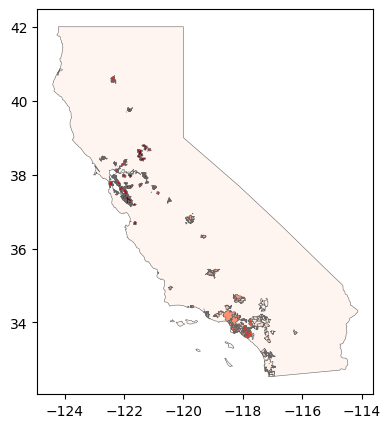

In [75]:
fig, ax = plt.subplots(figsize=(12, 5))
ca.plot(ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4")
city_ca.plot(ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4")
plt.show()

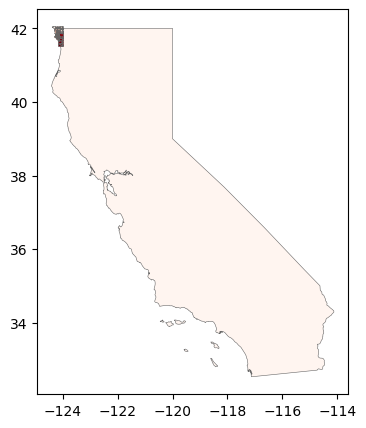

In [130]:
fig, ax = plt.subplots(figsize=(12, 5))
ca.plot(ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4")
til_shp.plot(ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4")
plt.show()

In [132]:
ds_meta = (wds.WebDataset(val_loc, shardshuffle=False)
      .decode("pil")
      .to_tuple("jpg", "json", "__key__")
      .with_length(len(ds_val)))

In [135]:
ds_temp = (wds.WebDataset(val_loc, shardshuffle=False)
      .decode("pil")
      .to_tuple("jpg", "json")
      .with_length(len(ds_val))
      .map(T.AerMAETransforms(is_train=False, mu=mu, sigma=sigma)))

ds_temp = DataLoader(ds_temp, batch_size=16)

In [118]:
from torch.amp import autocast
from tqdm import tqdm

In [119]:
def local_loss(y_true, y_pred, mask, weight: float=0.05):
    loss = (y_true - y_pred) ** 2
    loss = loss.mean(dim=-1)

    unmasked = 1 - mask

    masked_loss = (loss * mask).sum(dim=1) / mask.sum(dim=1)
    unmasked_loss = (loss * unmasked * weight).sum(dim=1) / unmasked.sum(dim=1)
    return masked_loss, unmasked_loss

In [136]:
masked_losses = []
unmasked_losses = []

with tqdm(ds_temp) as pbar:
    model = mae.eval()
    model = model.to('cuda')
    for x, meta in pbar:
        x = x.to('cuda')
        meta = meta.to('cuda')

        with autocast('cuda'):
            y = T.patch_images(x, mae.patch_size)
            y_hat, masks = model(x, meta)
            masked_loss, unmasked_loss = local_loss(y, y_hat, masks)

        masked_loss = masked_loss.detach().cpu().numpy()
        unmasked_loss = unmasked_loss.detach().cpu().numpy()
        for loss in masked_loss:
            masked_losses.append(loss)
        for loss in zip(unmasked_loss):
            unmasked_losses.append(loss)

masked_losses = np.array(masked_losses)
unmasked_losses = np.array(unmasked_losses)

100%|██████████| 4688/4688 [05:04<00:00, 15.42it/s]


In [11]:
df_examine = gd.read_file('./val_pretrain_loss.json')

In [ ]:
df_examine = df.drop_duplicates(subset=['key'], keep='first').reset_index()
df_examine['masked_loss'] = masked_losses
df_examine['unmasked_loss'] = unmasked_losses
df_examine['loss'] = df_examine['unmasked_loss'] + df_examine['masked_loss']
df_examine.to_file('val_pretrain_loss.json', driver="GeoJSON")

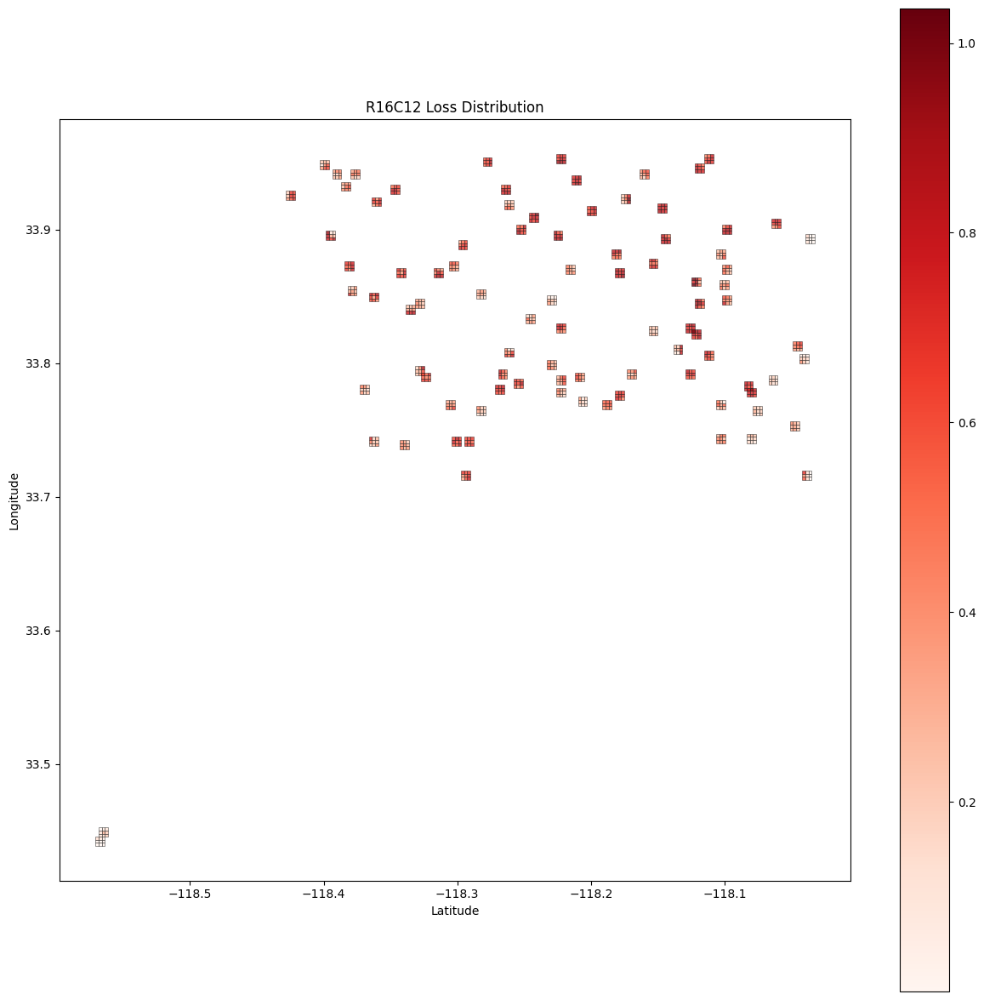

In [146]:
fig, ax = plt.subplots(figsize=(15, 15))
df_examine[df_examine['tile_id'] == 'R16C12'].plot(column='loss', cmap='Reds', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
ax.set_title('R16C12 Loss Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

In [145]:
df_examine[df_examine['tile_id'] == 'R16C12'].sort_values('loss', ascending=False)[['Link', 'Date', 'Photo_ID', 'scale', 'altitude', 'key', 'loss']].head()

,Link,Date,Photo_ID,scale,altitude,key,loss
8376,https://earthexplorer.usgs.gov/scene/metadata/...,1963/02/28,1VASK00010091,30000.0,15000.0,R16C12_040_197_2,1.036388
2087,https://earthexplorer.usgs.gov/scene/metadata/...,1963/02/28,1VASK00010039,30000.0,15000.0,R16C12_013_174_7,1.030589
26773,https://earthexplorer.usgs.gov/scene/metadata/...,1963/02/28,1VASK00010091,30000.0,15000.0,R16C12_040_197_0,1.004298
12983,https://earthexplorer.usgs.gov/scene/metadata/...,1963/02/28,1VASK00010073,30000.0,15000.0,R16C12_019_144_6,0.978006
12042,https://earthexplorer.usgs.gov/scene/metadata/...,1963/02/28,1VASK00020014,30000.0,15000.0,R16C12_057_197_0,0.967957


In [19]:
df_examine.columns

Index(['index', 'state', 'tile_id', 'block_r', 'block_c', 'index_right',
       'Link', 'Date', 'Photo_ID', 'scale', 'altitude', 'key', 'level_0',
       'level_1', 'id', 'masked_loss', 'unmasked_loss', 'loss', 'geometry'],
      dtype='object')

In [23]:
avg_loss = (df_examine[['tile_id', 'loss', 'unmasked_loss', 'masked_loss']]
    .groupby('tile_id')
    .mean()
    .reset_index())

ca_tiles = ca_tiles.merge(avg_loss, left_on='id', right_on='tile_id', how='left').drop(columns='tile_id')

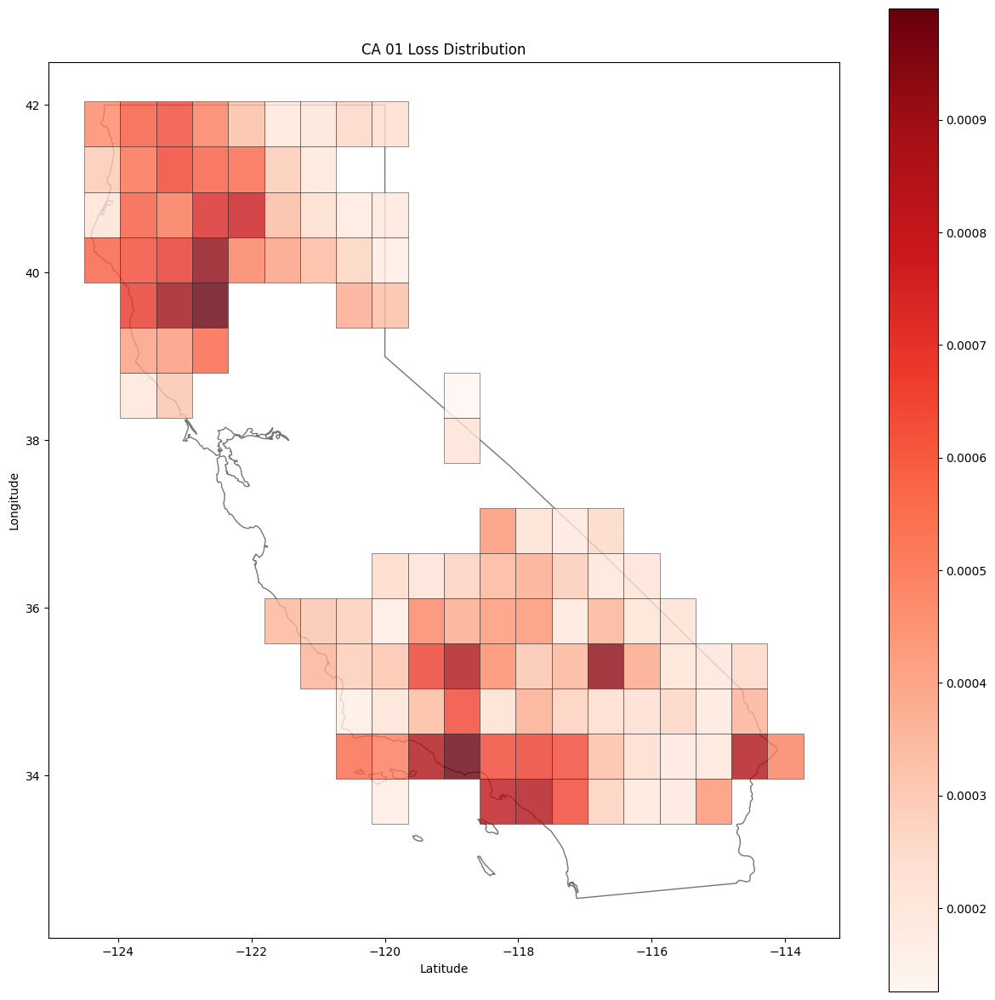

In [24]:
fig, ax = plt.subplots(figsize=(15, 15))
ca.plot(facecolor='white', ax=ax, edgecolor=".4", alpha=0.9)
ca_tiles.plot(column='unmasked_loss', cmap='Reds', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
#ca_tiles.plot(facecolor='white', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.3)
#df.plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA 01 Loss Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

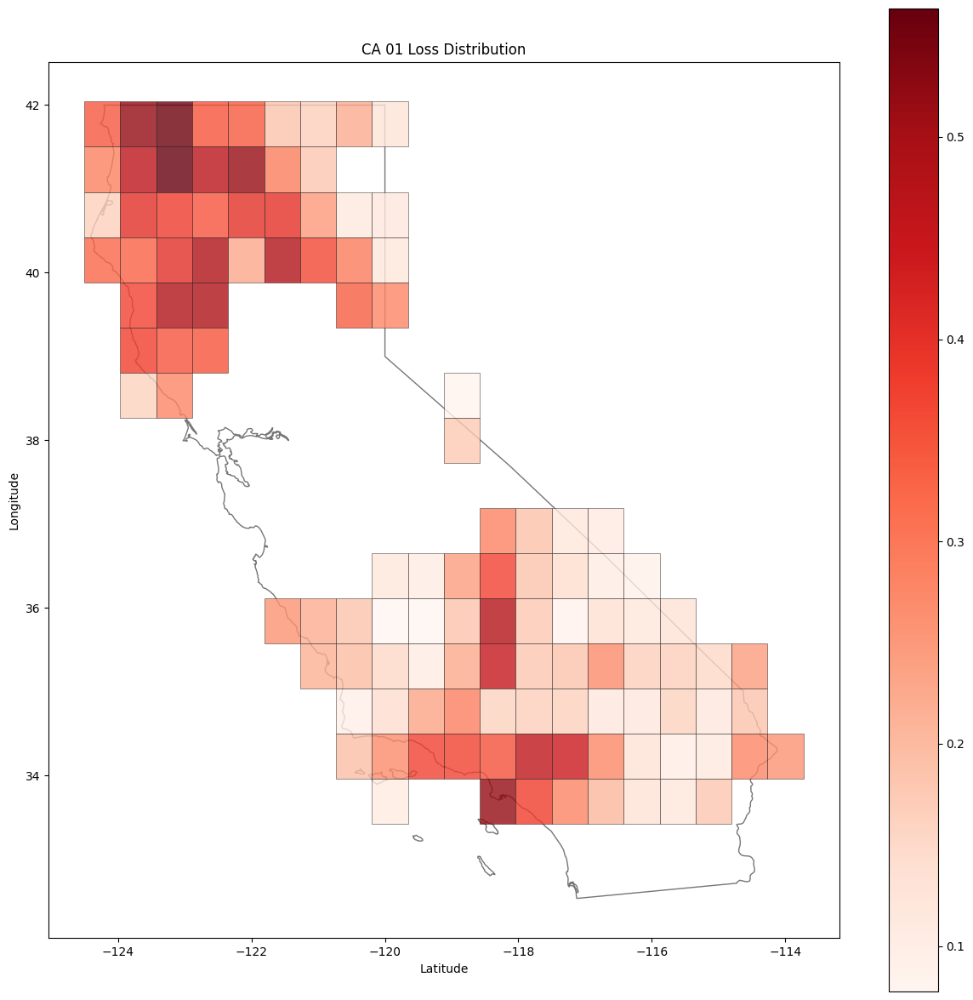

In [25]:
fig, ax = plt.subplots(figsize=(15, 15))
ca.plot(facecolor='white', ax=ax, edgecolor=".4", alpha=0.9)
ca_tiles.plot(column='masked_loss', cmap='Reds', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
#ca_tiles.plot(facecolor='white', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.3)
#df.plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA 01 Loss Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

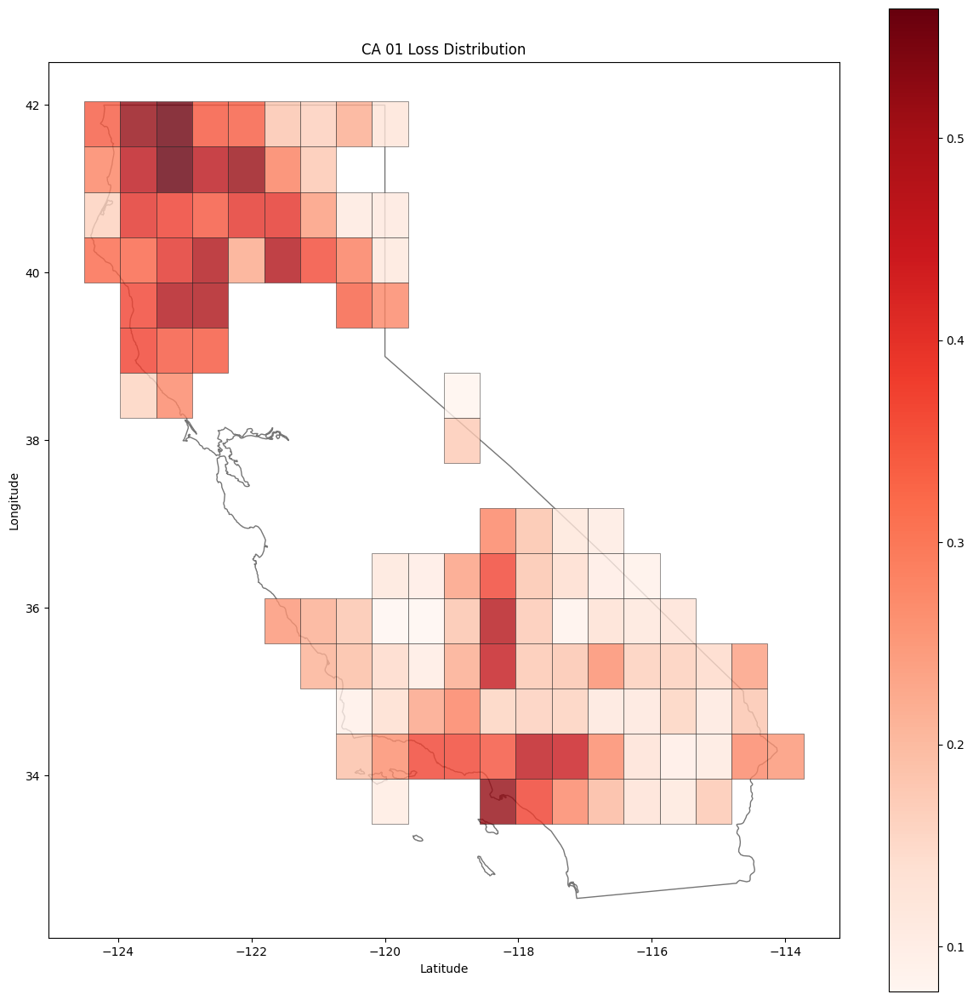

In [13]:
fig, ax = plt.subplots(figsize=(15, 15))
ca.plot(facecolor='white', ax=ax, edgecolor=".4", alpha=0.9)
ca_tiles.plot(column='loss', cmap='Reds', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
#ca_tiles.plot(facecolor='white', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.3)
#df.plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA 01 Loss Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

In [133]:
df = get_geo_df(ds_meta, limit=len(ds_meta))
df = df.drop_duplicates()

In [128]:
df.to_file('val_shapes.json', driver="GeoJSON")
df.shape

c:\Users\micha\miniconda3\envs\aer_env\Lib\site-packages\pyogrio\geopandas.py:662: UserWarning: 'crs' was not provided.  The output dataset will not have projection information defined and may not be usable in other systems.
  write(


(112151, 15)

In [129]:
def get_loss(sample, tr) -> float:
    img, loc = tr(sample)
    img = img.unsqueeze(0)
    loc = loc.unsqueeze(0)
    y = T.patch_images(img, mae.patch_size)
    y_hat, masks = l_mae.mae(img, loc)
    #y = T.normalize_patches(y)
    return mae_loss(y, y_hat, masks).detach().item()

def get_out(sample, tr) -> np.array:
    img, loc = tr(sample)
    img = img.unsqueeze(0)
    loc = loc.unsqueeze(0)
    y_hat, _ = l_mae.mae(img, loc)
    return T.unpatch_images(y_hat).detach().numpy()

def get_geo(sample) -> gd.GeoDataFrame:
    df = gd.GeoDataFrame.from_features(sample[1])
    df['key'] = sample[2]
    return df

def get_geo_df(ds, limit=1000) -> gd.GeoDataFrame:
    it = iter(ds)
    return pd.concat([get_geo(next(it)) for _ in range(limit)])

def get_geo_loss(sample, tr) -> gd.GeoDataFrame:
    df = gd.GeoDataFrame.from_features(sample[1])
    df['loss'] = get_loss(sample, tr)
    return df

def get_loss_df(ds, limit=1000) -> list[gd.GeoDataFrame]:
    it = iter(ds)
    tr = T.AerMAETransforms(is_train=False, mu=mu, sigma=sigma)
    return pd.concat([get_geo_loss(next(it), tr) for _ in range(limit)])

def get_geo_pxl(sample) -> gd.GeoDataFrame:
    df = gd.GeoDataFrame.from_features(sample[1])
    df['color'] = np.array(sample[0]).mean() / 255
    return df

def get_pxl_df(ds, limit=1000) -> list[gd.GeoDataFrame]:
    it = iter(ds)
    return pd.concat([get_geo_pxl(next(it)) for _ in range(limit)])

def get_coords_df(df, min_threshold=0, max_threshold=1, limit: int=25, is_rand: bool=False) -> pd.DataFrame:
    min_filter = df['loss'] >= min_threshold
    max_filter = df['loss'] <= max_threshold
    blocks = df[min_filter & max_filter][['block_r', 'block_c', 'tile_id']]
    blocks = blocks.drop_duplicates().reset_index(drop=True)
    return blocks.sample(n=limit) if is_rand else blocks[:limit]

def get_coords_set(df) -> set[str]:
    block_x = df['block_r'].astype(str).str.pad(width=3, side='left', fillchar='0')
    block_y = df['block_c'].astype(str).str.pad(width=3, side='left', fillchar='0')
    tile_id = df['tile_id']
    return set(block_x + block_y + tile_id)

def get_coords_key(block_x: int, block_y: int, tile_id: str) -> str:
    return str(block_x).zfill(3) + str(block_y).zfill(3) + tile_id

def filter_coords(ds, coords) -> tuple:
    it = iter(ds)
    images = []
    locs = []
    coords_set = get_coords_set(coords)

    for img, meta in it:
        props = meta['features'][0]['properties']
        block_x = props['block_r']
        block_y = props['block_c']
        tile_id = props['tile_id']
        key = get_coords_key(block_x, block_y, tile_id)

        if len(coords_set) == 0:
            break

        if key in coords_set:
            coords_set.remove(key)
            images.append(img)
            year = int(props['Date'][:4])
            locs.append([block_x, block_y, tile_id, year])

    return images, locs


In [66]:
df_pxl = get_pxl_df(ds_meta, limit=len(ds_meta))

In [67]:
df_pxl.head()

,geometry,state,tile_id,block_r,block_c,index_right,Link,Date,Photo_ID,color,level_0,level_1,id
0,"POLYGON ((-120.03821 39.97115, -120.03821 39.9...",California,R04C09,194,65,72,https://earthexplorer.usgs.gov/scene/metadata/...,1956/11/27,A0016004A0640,0.600112,NaN,NaN,NaN
1,"POLYGON ((-120.03821 39.97115, -120.03821 39.9...",California,R04C09,194,65,55,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/05,A010908610979,0.600112,NaN,NaN,NaN
2,"POLYGON ((-120.03821 39.97115, -120.03821 39.9...",California,R04C09,194,65,43,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/05,A010908010183,0.600112,NaN,NaN,NaN
0,"POLYGON ((-120.13939 39.95735, -120.13939 39.9...",California,R04C09,200,21,57,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/05,A010908610981,0.335287,NaN,NaN,NaN
1,"POLYGON ((-120.13939 39.95735, -120.13939 39.9...",California,R04C09,200,21,56,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/05,A010908610980,0.335287,NaN,NaN,NaN


In [155]:
df = get_loss_df(ds_meta, limit=len(ds_meta))

Epoch 0:   1%|          | 8/782 [25:36:18<2477:17:22,  0.00it/s, v_num=3, train_loss_step=2.950]


In [43]:
df['Link'].iloc[0]

'https://earthexplorer.usgs.gov/scene/metadata/full/5e83d8e4870f4473/ARA0016004A0640/'

In [134]:
df.head()

,geometry,state,tile_id,block_r,block_c,index_right,Link,Date,Photo_ID,loss,level_0,level_1,id
0,"POLYGON ((-120.03821 39.97115, -120.03821 39.9...",California,R04C09,194,65,72,https://earthexplorer.usgs.gov/scene/metadata/...,1956/11/27,A0016004A0640,0.101552,NaN,NaN,NaN
1,"POLYGON ((-120.03821 39.97115, -120.03821 39.9...",California,R04C09,194,65,55,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/05,A010908610979,0.101552,NaN,NaN,NaN
2,"POLYGON ((-120.03821 39.97115, -120.03821 39.9...",California,R04C09,194,65,43,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/05,A010908010183,0.101552,NaN,NaN,NaN
0,"POLYGON ((-120.13939 39.95735, -120.13939 39.9...",California,R04C09,200,21,57,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/05,A010908610981,0.716896,NaN,NaN,NaN
1,"POLYGON ((-120.13939 39.95735, -120.13939 39.9...",California,R04C09,200,21,56,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/05,A010908610980,0.716896,NaN,NaN,NaN


In [79]:
sns.set_style('darkgrid')

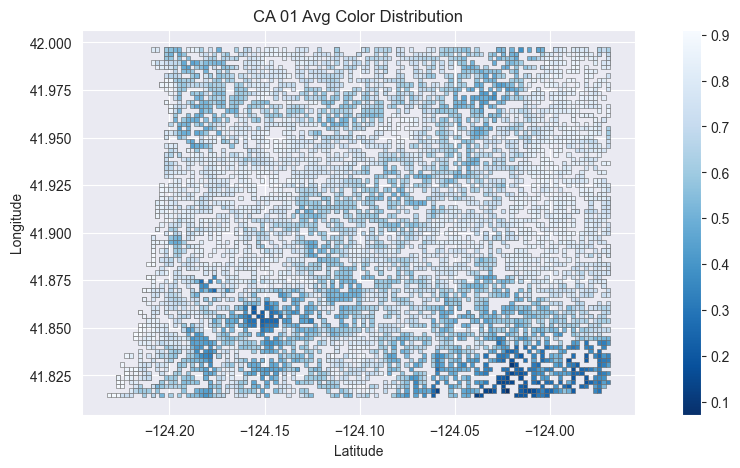

In [365]:
fig, ax = plt.subplots(figsize=(12, 5))
df_pxl.plot(column='color', ax=ax, cmap='Blues_r', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA 01 Avg Color Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

In [156]:
avg_loss = (df[['tile_id', 'loss']]
    .groupby('tile_id')
    .mean()
    .reset_index())

ca_tiles = ca_tiles.merge(avg_loss, left_on='id', right_on='tile_id', how='left').drop(columns='tile_id')

In [74]:
avg_year = (df[['tile_id', 'Year']]
    .groupby('tile_id')
    .mean()
    .reset_index())

ca_tiles = ca_tiles.merge(avg_year, left_on='id', right_on='tile_id', how='left').drop(columns='tile_id')

In [77]:
avg_color = (df_pxl[['tile_id', 'color']]
    .groupby('tile_id')
    .mean()
    .reset_index())

ca_tiles = ca_tiles.merge(avg_color, left_on='id', right_on='tile_id', how='left').drop(columns='tile_id')

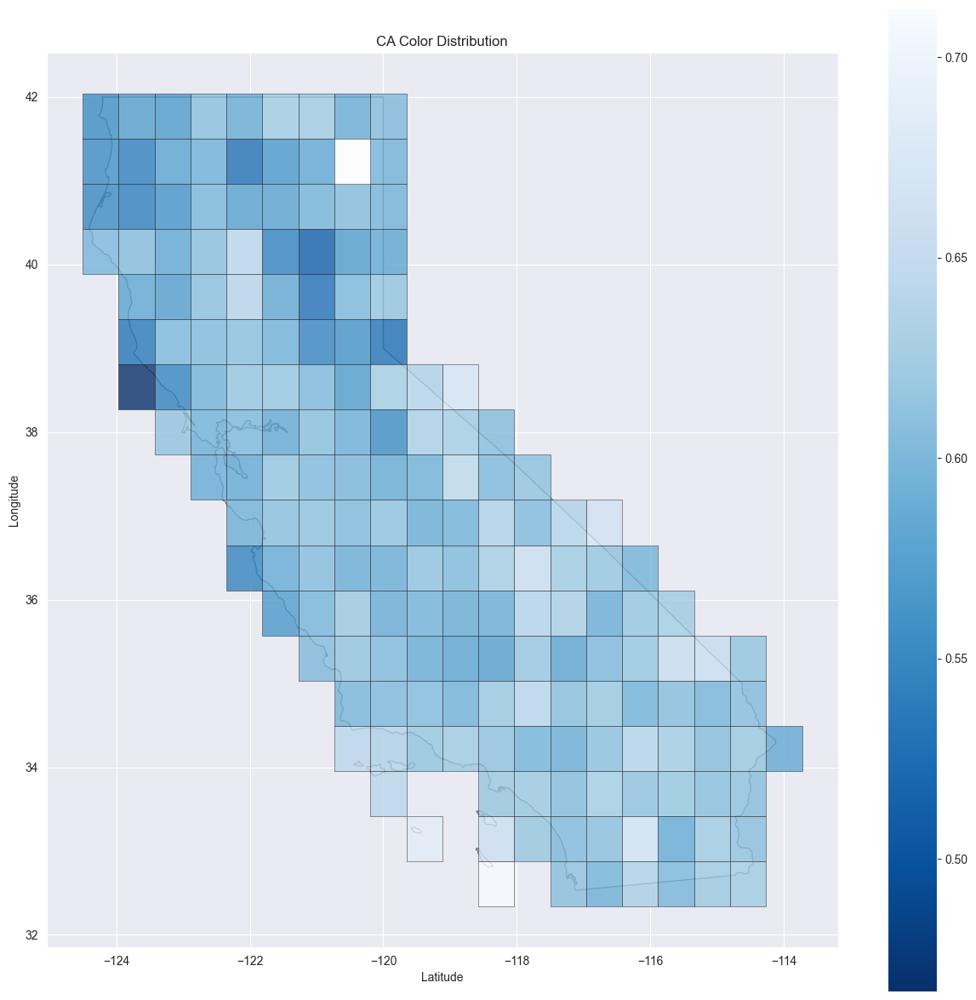

In [78]:
fig, ax = plt.subplots(figsize=(15, 15))
ca.plot(facecolor='white', ax=ax, edgecolor=".4", alpha=0.9)
ca_tiles.plot(column='color', cmap='Blues_r', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
#ca_tiles.plot(facecolor='white', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.3)
#df.plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA Color Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

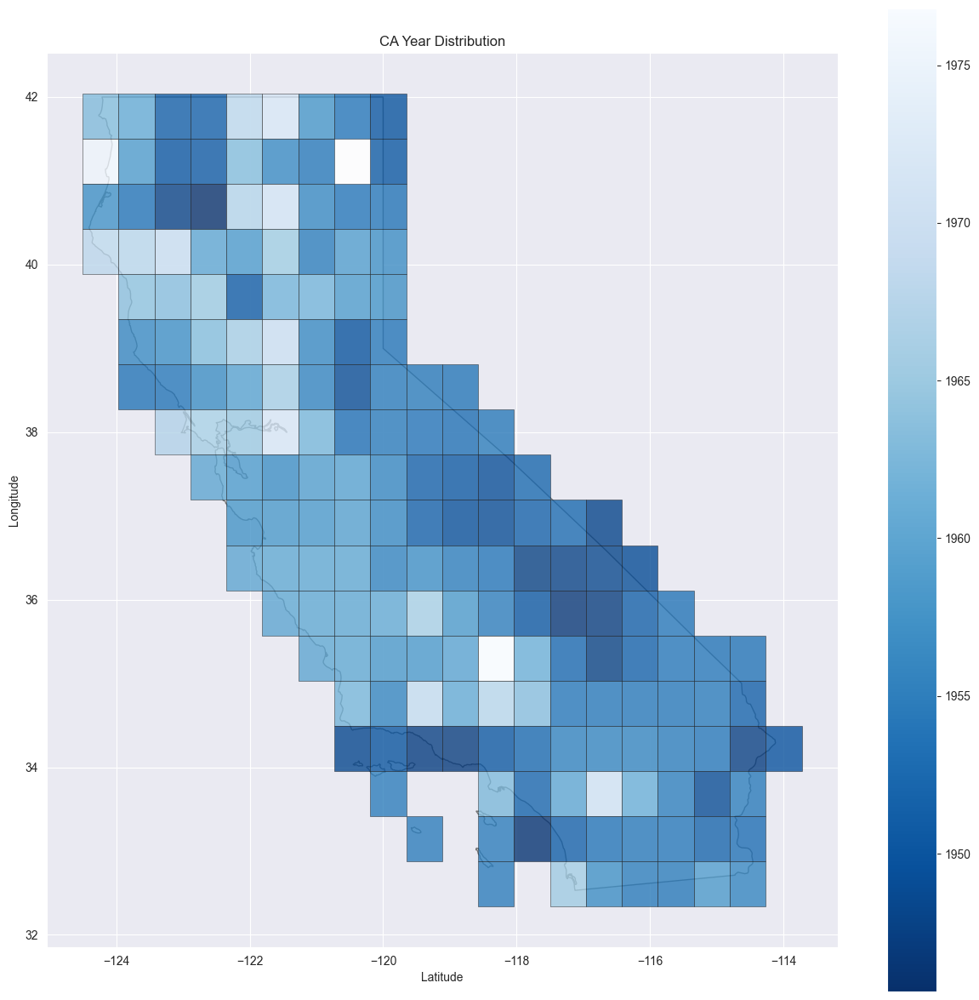

In [75]:
fig, ax = plt.subplots(figsize=(15, 15))
ca.plot(facecolor='white', ax=ax, edgecolor=".4", alpha=0.9)
ca_tiles.plot(column='Year', cmap='Blues_r', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
#ca_tiles.plot(facecolor='white', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.3)
#df.plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA Year Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

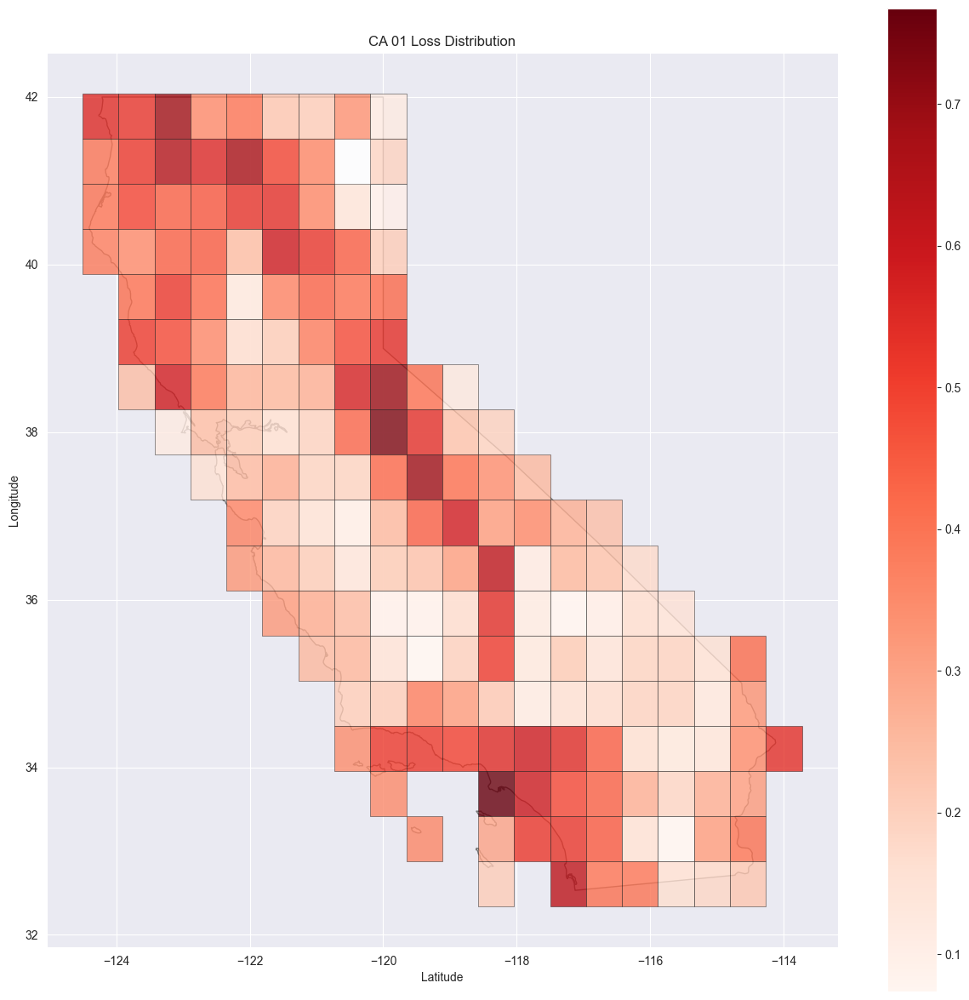

In [82]:
fig, ax = plt.subplots(figsize=(15, 15))
ca.plot(facecolor='white', ax=ax, edgecolor=".4", alpha=0.9)
ca_tiles.plot(column='loss', cmap='Reds', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
#ca_tiles.plot(facecolor='white', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.3)
#df.plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA 01 Loss Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

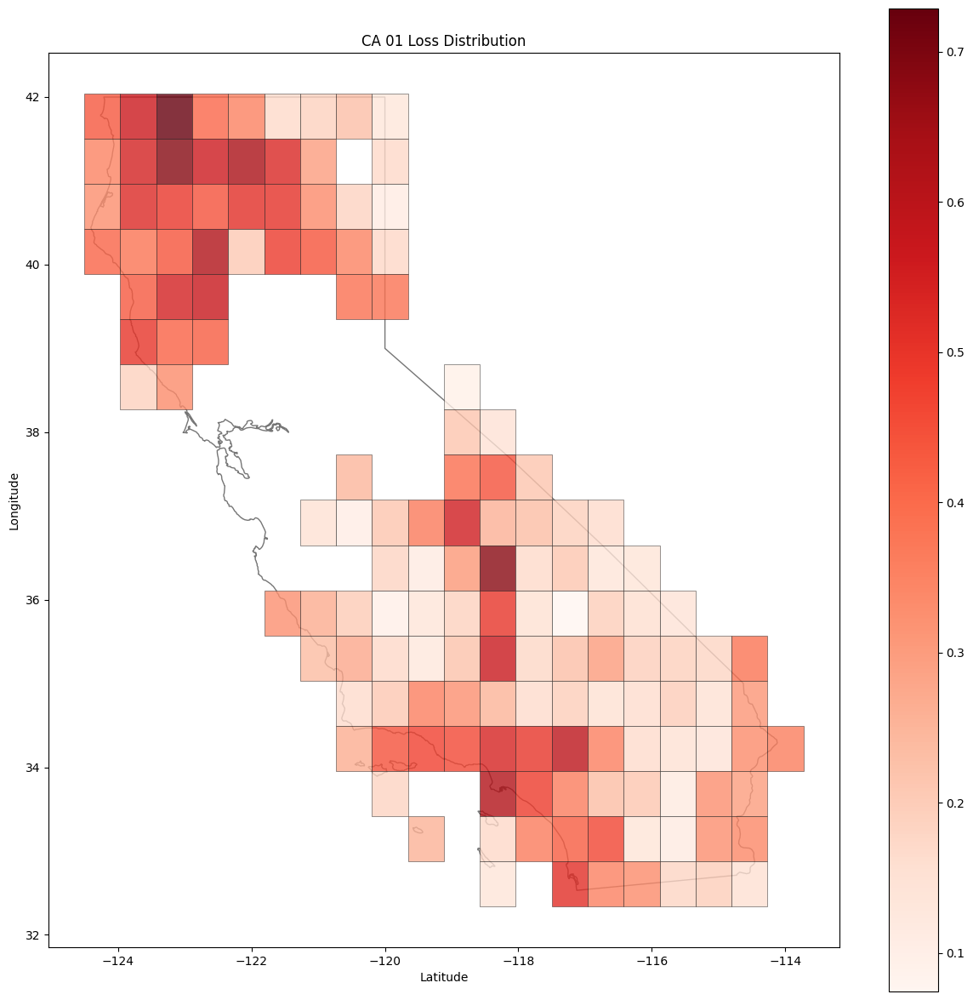

In [157]:
fig, ax = plt.subplots(figsize=(15, 15))
ca.plot(facecolor='white', ax=ax, edgecolor=".4", alpha=0.9)
ca_tiles.plot(column='loss', cmap='Reds', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
#ca_tiles.plot(facecolor='white', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.3)
#df.plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA 01 Loss Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

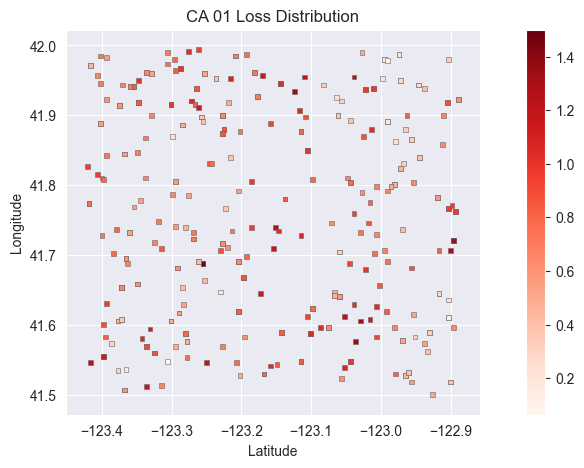

In [143]:
fig, ax = plt.subplots(figsize=(12, 5))
df[df['tile_id'] == 'R01C03'].plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4", legend=True)
ax.set_title('CA 01 Loss Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

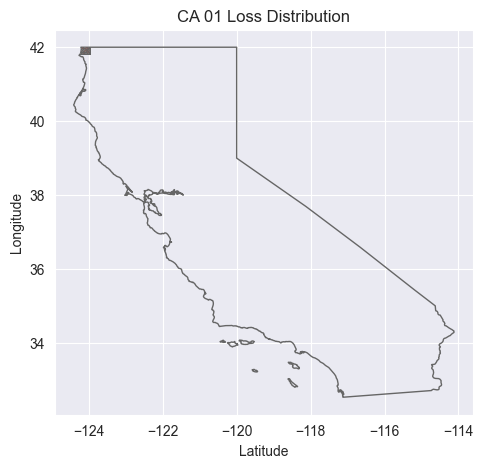

In [330]:
fig, ax = plt.subplots(figsize=(12, 5))
ca.plot(facecolor='none', ax=ax, edgecolor=".4")
df.plot(column='loss', ax=ax, cmap='Reds', linewidth=0.4, edgecolor=".4")
ax.set_title('CA 01 Loss Distribution')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

In [267]:
low_coords = get_coords_df(df, min_threshold=0, max_threshold=0.05, limit=25)
low_coords.head()

,block_x,block_y
0,46,144
1,56,136
2,58,137
3,58,138
4,58,142


In [144]:
low_coords_rand = get_coords_df(df, min_threshold=0, max_threshold=0.05, limit=25, is_rand=True)
low_coords_rand.head(5)

,block_r,block_c,tile_id
765,211,33,R12C11
2422,12,70,R18C19
1622,52,216,R11C14
2184,116,58,R12C17
3312,51,21,R15C17


In [170]:
high_coords = get_coords_df(df, min_threshold=0.8, max_threshold=1, limit=25)
high_coords.head()

,block_x,block_y
0,19,135
1,19,142
2,19,171
3,19,193
4,19,209


In [145]:
high_coords_rand = get_coords_df(df, min_threshold=0.8, max_threshold=1, limit=25, is_rand=True)
high_coords_rand.head(5)

,block_r,block_c,tile_id
924,12,134,R12C14
731,96,73,R09C11
401,36,84,R12C12
1658,131,128,R16C15
626,231,160,R02C05


In [ ]:
high_images = filter_coords(ds_meta, high_coords)

In [269]:
low_images = filter_coords(ds_meta, low_coords)

In [147]:
low_images_rand, low_image_locs = filter_coords(ds_meta, low_coords_rand)

In [148]:
high_images_rand, high_image_locs = filter_coords(ds_meta, high_coords_rand)

In [150]:
def plot_filter(images):
    _, axs = plt.subplots(5, 5, figsize=(9, 9))

    for i, img in enumerate(images):
        ax = axs[i // 5, i % 5]
        ax.imshow(img, cmap='gray')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

def plot_sample(ds):
    _, axs = plt.subplots(5, 5, figsize=(9, 9))
    it = iter(ds)

    for i in range(25):
        img, _ = next(it)
        ax = axs[i // 5, i % 5]
        ax.imshow(img[0], cmap='gray')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

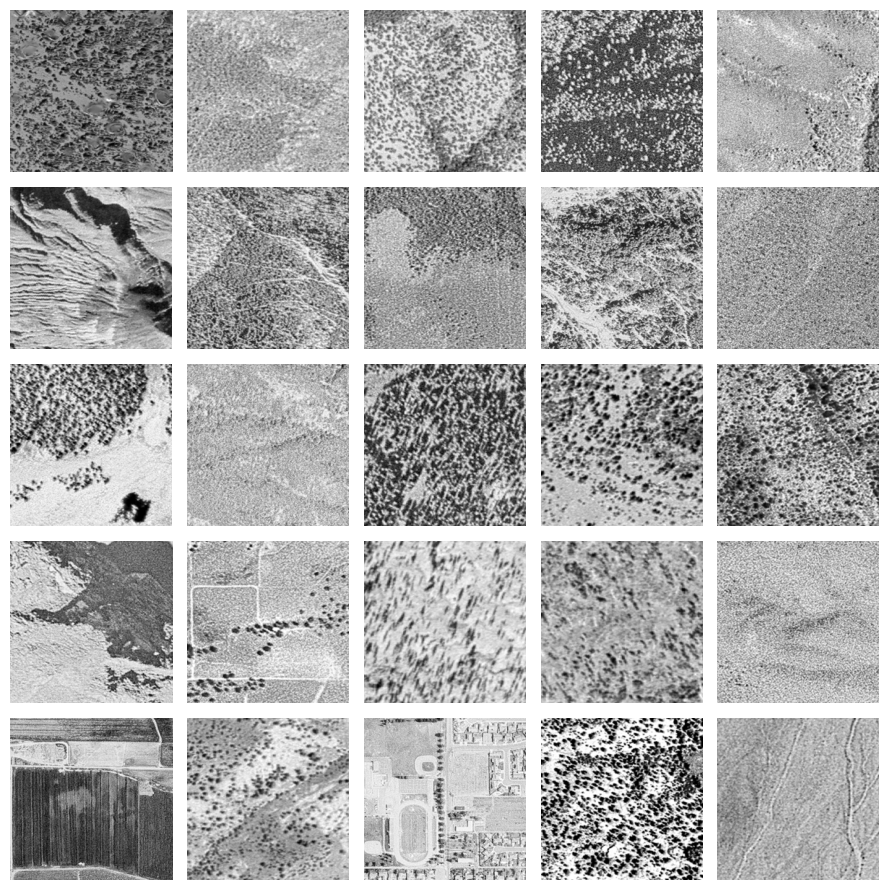

In [147]:
plot_sample(ds_train)

In [334]:
def low_pass_pct(img, thresh):
    arr = np.array(img.convert('L'))
    neg = arr < thresh
    return neg.sum() / neg.size

In [430]:
import math
import cv2
from scipy import signal
from skimage.restoration import estimate_sigma

In [451]:
def estimate_noise(img):
    img = np.array(img.convert('L'))
    return float(estimate_sigma(img, average_sigmas=True))

In [447]:
def estimate_noise(img):
  img = np.array(img.convert('L'))
  H, W = img.shape

  M = [[1, -2, 1],
       [-2, 4, -2],
       [1, -2, 1]]

  sigma = np.sum(np.sum(np.absolute(signal.convolve2d(img, M))))
  sigma = sigma * math.sqrt(0.5 * math.pi) / (6 * (W-2) * (H-2))

  return float(sigma)

In [532]:
high_image_locs

[[85, 38, 'R01C05', 1951],
 [15, 51, 'R05C04', 1965],
 [62, 164, 'R01C01', 1955],
 [64, 30, 'R03C06', 1975],
 [49, 44, 'R01C02', 1952],
 [4, 87, 'R05C06', 1951],
 [214, 50, 'R04C04', 1965],
 [185, 207, 'R12C12', 1954],
 [216, 197, 'R12C12', 1954],
 [14, 135, 'R02C05', 1960],
 [203, 153, 'R09C09', 1954],
 [128, 222, 'R11C12', 1954],
 [187, 36, 'R07C10', 1955],
 [122, 31, 'R02C04', 1951],
 [186, 213, 'R08C11', 1954],
 [217, 142, 'R08C11', 1955],
 [185, 85, 'R08C09', 1954],
 [139, 78, 'R08C09', 1954],
 [49, 202, 'R12C12', 1954],
 [104, 102, 'R08C09', 1954],
 [191, 116, 'R07C09', 1955],
 [1, 2, 'R06C09', 1953],
 [19, 43, 'R06C09', 1953],
 [170, 224, 'R07C09', 1955],
 [78, 109, 'R07C03', 1954]]

In [531]:
low_image_locs

[[123, 5, 'R03C08', 1954],
 [68, 136, 'R01C05', 1975],
 [142, 78, 'R12C10', 1969],
 [155, 187, 'R13C18', 1954],
 [29, 116, 'R09C11', 1951],
 [16, 111, 'R12C07', 1960],
 [55, 156, 'R09C11', 1951],
 [129, 100, 'R13C11', 1952],
 [102, 152, 'R13C11', 1952],
 [41, 144, 'R18C16', 1954],
 [70, 137, 'R08C07', 1954],
 [88, 209, 'R05C04', 1965],
 [170, 74, 'R17C17', 1954],
 [224, 56, 'R09C08', 1958],
 [82, 29, 'R15C17', 1954],
 [215, 139, 'R15C17', 1954],
 [135, 141, 'R10C07', 1960],
 [133, 200, 'R15C16', 1954],
 [142, 158, 'R10C07', 1960],
 [20, 58, 'R08C11', 1954],
 [62, 199, 'R17C17', 1954],
 [103, 132, 'R13C11', 1952],
 [2, 187, 'R07C05', 1954],
 [8, 207, 'R07C02', 1954],
 [108, 217, 'R11C09', 1954]]

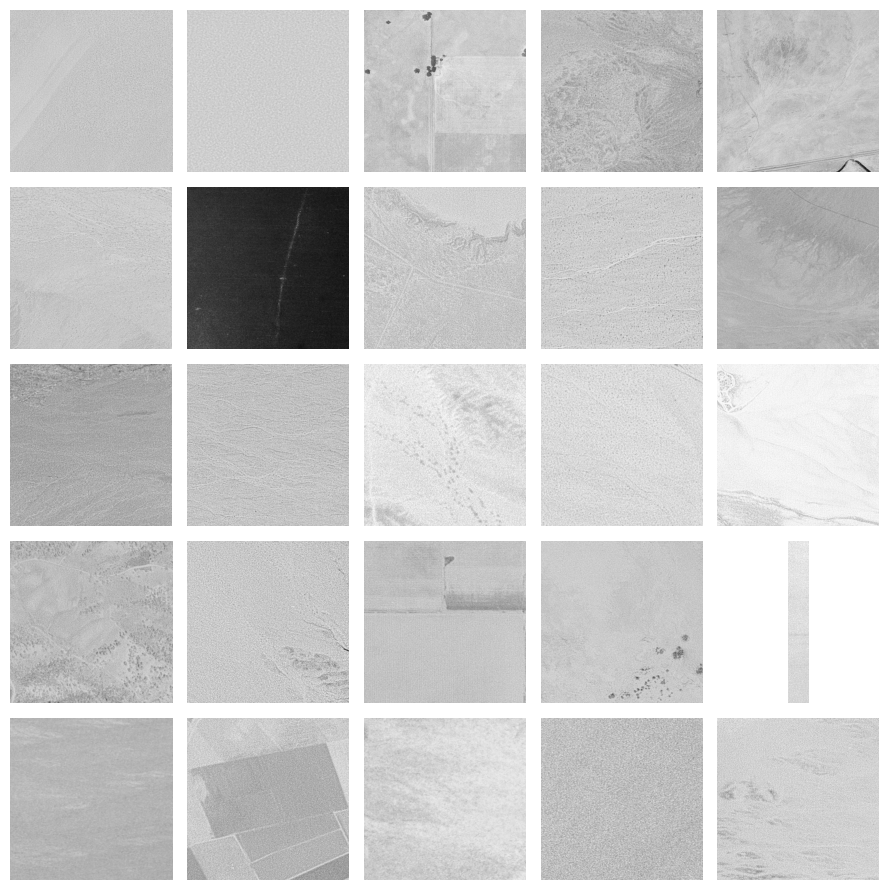

In [151]:
plot_filter(low_images_rand)

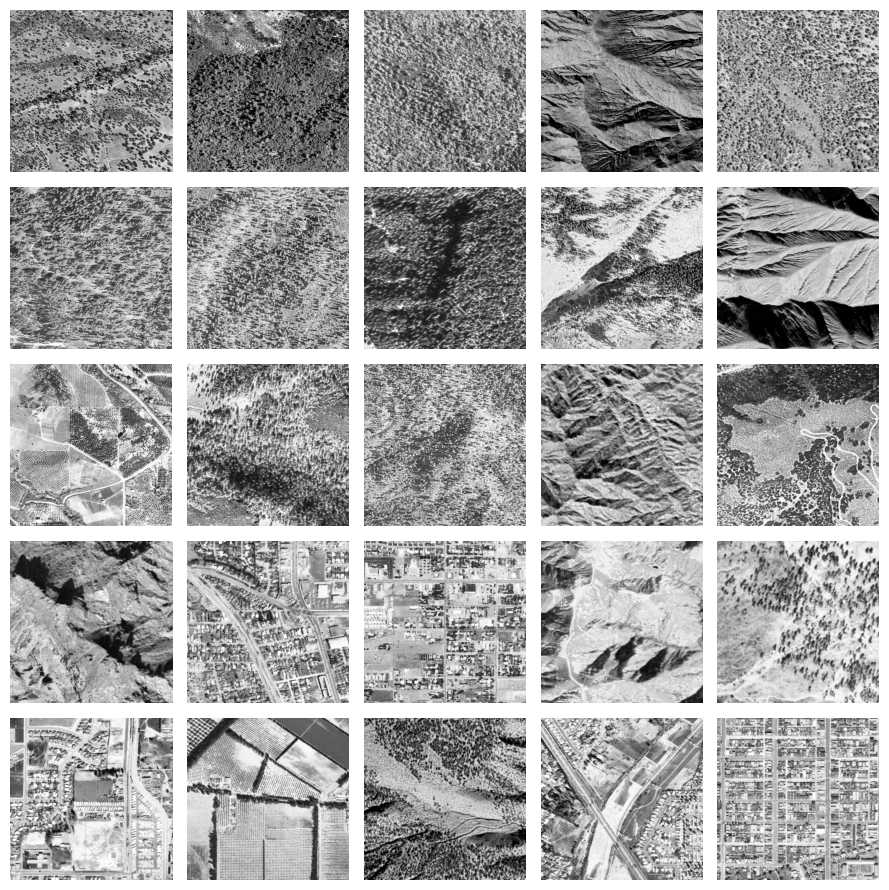

In [152]:
plot_filter(high_images_rand)

In [228]:
df[df['Link'] != 'NA'].sort_values('Year', ascending=False)['Link'].iloc[10]

'https://earthexplorer.usgs.gov/scene/metadata/full/5e83d8e4870f4473/AR1VELM00020018/'

In [97]:
df[(df['block_r'] == 170) & (df['block_c'] == 74)].head(10)

,geometry,state,tile_id,block_r,block_c,index_right,Link,Date,Photo_ID,loss,level_0,level_1,id
0,"POLYGON ((-122.17347 40.56533, -122.17347 40.5...",California,R03C05,170,74,140,https://earthexplorer.usgs.gov/scene/metadata/...,1963/05/14,1VASL00010146,0.349526,NaN,NaN,NaN
1,"POLYGON ((-122.17347 40.56533, -122.17347 40.5...",California,R03C05,170,74,139,https://earthexplorer.usgs.gov/scene/metadata/...,1963/05/14,1VASL00010145,0.349526,NaN,NaN,NaN
2,"POLYGON ((-122.17347 40.56533, -122.17347 40.5...",California,R03C05,170,74,41,https://earthexplorer.usgs.gov/scene/metadata/...,1943/09/06,1AN0000010022,0.349526,NaN,NaN,NaN
0,"POLYGON ((-115.7056 33.01948, -115.7056 33.026...",California,R17C17,170,74,35,https://earthexplorer.usgs.gov/scene/metadata/...,1954/09/28,A001450564432,0.041738,NaN,NaN,NaN
0,"POLYGON ((-115.7056 33.55847, -115.7056 33.565...",California,R16C17,170,74,144,https://earthexplorer.usgs.gov/scene/metadata/...,1954-09-28,A001450564440,0.206790,33.0,4.0,0004000000000000125a


In [148]:
low_coords_rand.iloc[21]

block_r         0
block_c       198
tile_id    R13C10
Name: 2888, dtype: object

In [162]:
low_image_locs[5]

[165, 69, 'R12C14']

In [168]:
df.head()['Link'].iloc[0]

'https://earthexplorer.usgs.gov/scene/metadata/full/5e83d8e4870f4473/ARA0016004A0640/'

In [189]:
df[(df['block_r'] == 165) & (df['block_c'] == 69) & (df['tile_id'] == 'R12C14')]

,geometry,state,tile_id,block_r,block_c,index_right,Link,Date,Photo_ID,loss,level_0,level_1,id,Year
0,"POLYGON ((-117.33407 35.72594, -117.33407 35.7...",California,R12C14,165,69,11393,https://earthexplorer.usgs.gov/scene/metadata/...,1946-10-01,1CG0000010086,0.007878,63.0,83.0,00040000000000002a27,1946
1,"POLYGON ((-117.33407 35.72594, -117.33407 35.7...",California,R12C14,165,69,11311,https://earthexplorer.usgs.gov/scene/metadata/...,1946-10-01,1CG0000010086,0.007878,62.0,1.0,00040000000000000d7e,1946


In [71]:
df_pxl['Year'] = df_pxl['Date'].str[:4]
df_pxl['Year'] = df_pxl['Year'].astype(int)

In [72]:
df['Year'] = df['Date'].str[:4]
df['Year'] = df['Year'].astype(int)

Text(0.5, 1.0, 'Pixel Avg by Year')

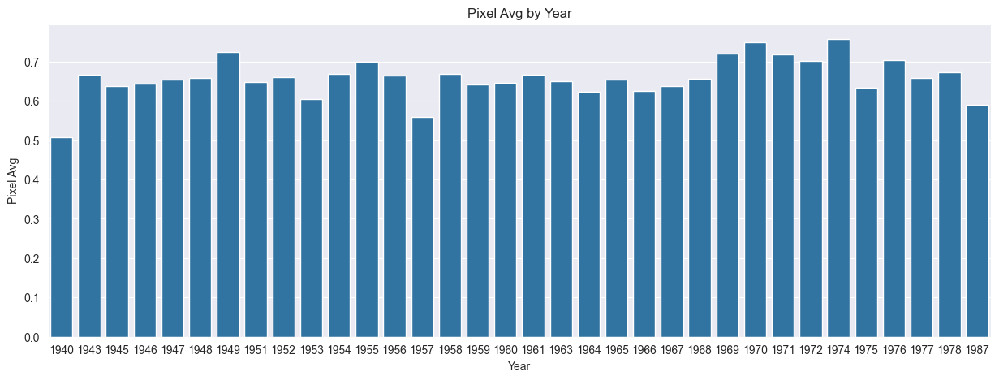

In [203]:
_ = plt.figure(figsize=(15, 5))
avg_color_by_year = df_pxl[['Year', 'color']].groupby('Year').mean().reset_index()
ax = sns.barplot(avg_color_by_year, x='Year', y='color')
ax.set_xlabel('Year')
ax.set_ylabel('Pixel Avg')
ax.set_title('Pixel Avg by Year')

In [205]:
_, meta = next(iter(ds_meta))

In [206]:
meta

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {'state': 'California',
    'tile_id': 'R04C09',
    'block_r': 194,
    'block_c': 65,
    'index_right': 72,
    'Link': 'https://earthexplorer.usgs.gov/scene/metadata/full/5e83d8e4870f4473/ARA0016004A0640/',
    'Date': '1956/11/27',
    'Photo_ID': 'A0016004A0640'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-120.03820629053243, 39.97114942129131],
      [-120.03820629053243, 39.978048482673344],
      [-120.04510535191447, 39.978048482673344],
      [-120.04510535191447, 39.97114942129131],
      [-120.03820629053243, 39.97114942129131]]]}},
  {'id': '1',
   'type': 'Feature',
   'properties': {'state': 'California',
    'tile_id': 'R04C09',
    'block_r': 194,
    'block_c': 65,
    'index_right': 55,
    'Link': 'https://earthexplorer.usgs.gov/scene/metadata/full/5e83d8e4870f4473/ARA010908610979/',
    'Date': '1954/09/05',
    'Photo_ID': 'A010908610979'},
   'geometry':

Text(0, 0.5, 'Count')

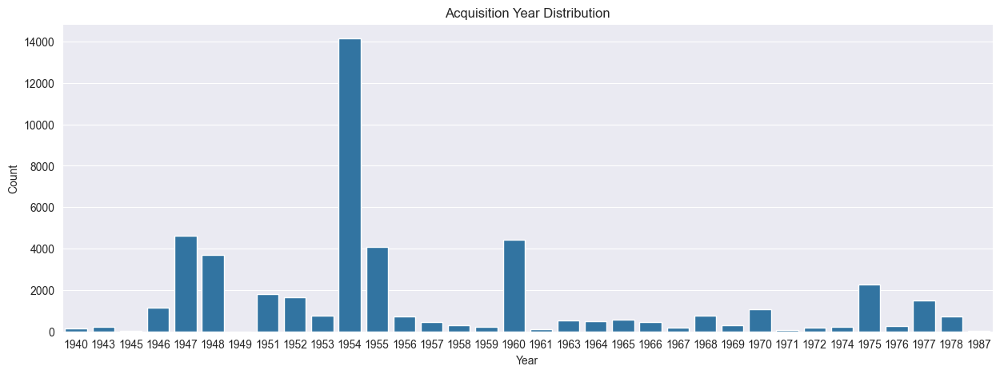

In [188]:
_ = plt.figure(figsize=(15, 5))
ax = sns.countplot(df[['block_c', 'block_r', 'tile_id', 'Year']].drop_duplicates().reset_index(drop=True), x='Year', order=df['Year'].sort_values().unique())
ax.set_title('Acquisition Year Distribution')
ax.set_xlabel('Year')
ax.set_ylabel('Count')

In [178]:
df.groupby('Year').size().reset_index(drop=True)

0       181
1       338
2        27
3      2848
4      8179
5      5157
6         1
7      2479
8      2224
9      1095
10    17626
11     4984
12     1008
13      596
14      480
15      335
16     5631
17      182
18      850
19      693
20      881
21      794
22      331
23     1139
24      457
25     1259
26       85
27      283
28      251
29     2758
30      306
31     1802
32      876
33       26
dtype: int64

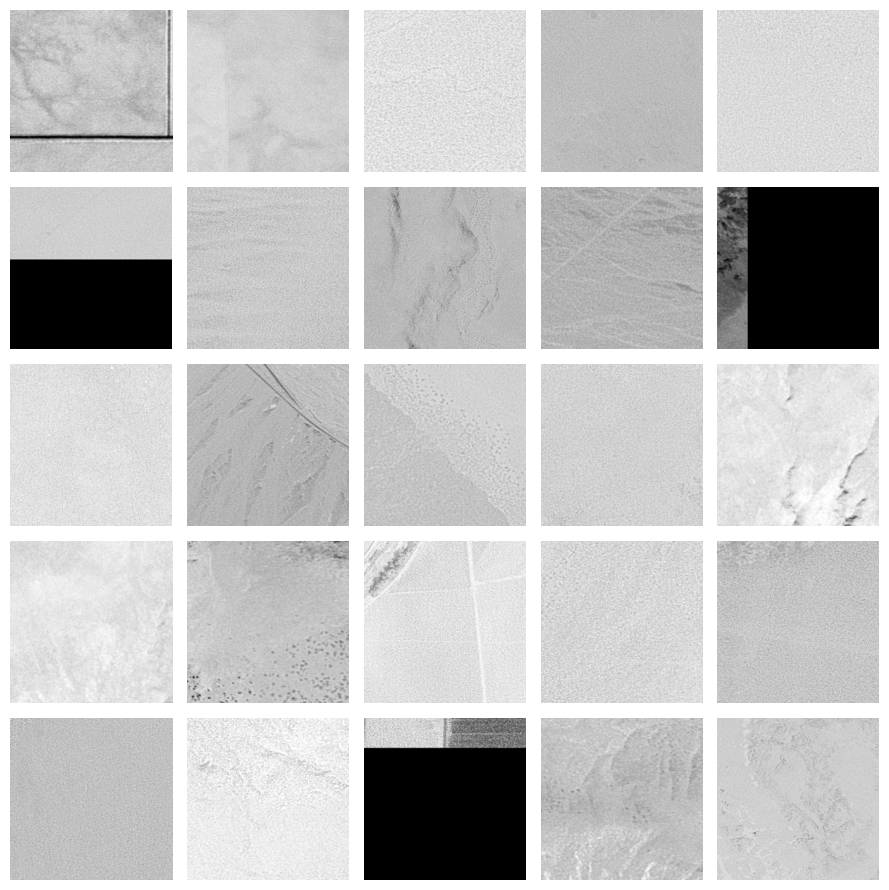

In [160]:
plot_filter(low_images_rand)

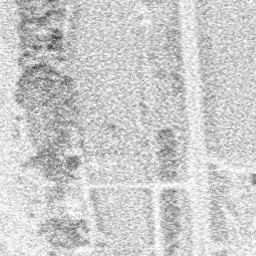

In [259]:
next(iter(ds_meta))[0]

In [ ]:
get_loss(next(iter(ds_meta)), T.AerMAETransforms(is_train=False, mu=mu, sigma=sigma))

0.2039628028869629

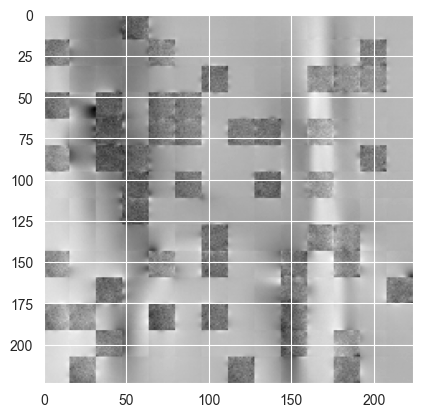

In [ ]:
plt.imshow(get_out(next(iter(ds_meta)), T.AerMAETransforms(is_train=False, mu=mu, sigma=sigma))[0], cmap='gray')

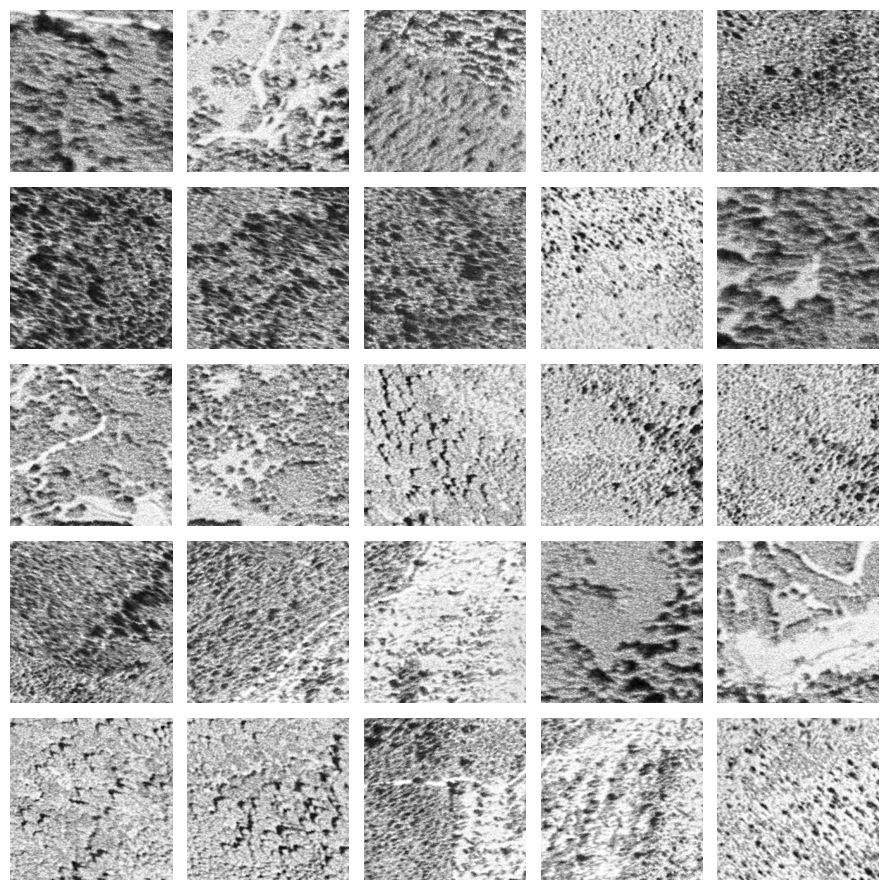

In [184]:
plot_filter(high_images)

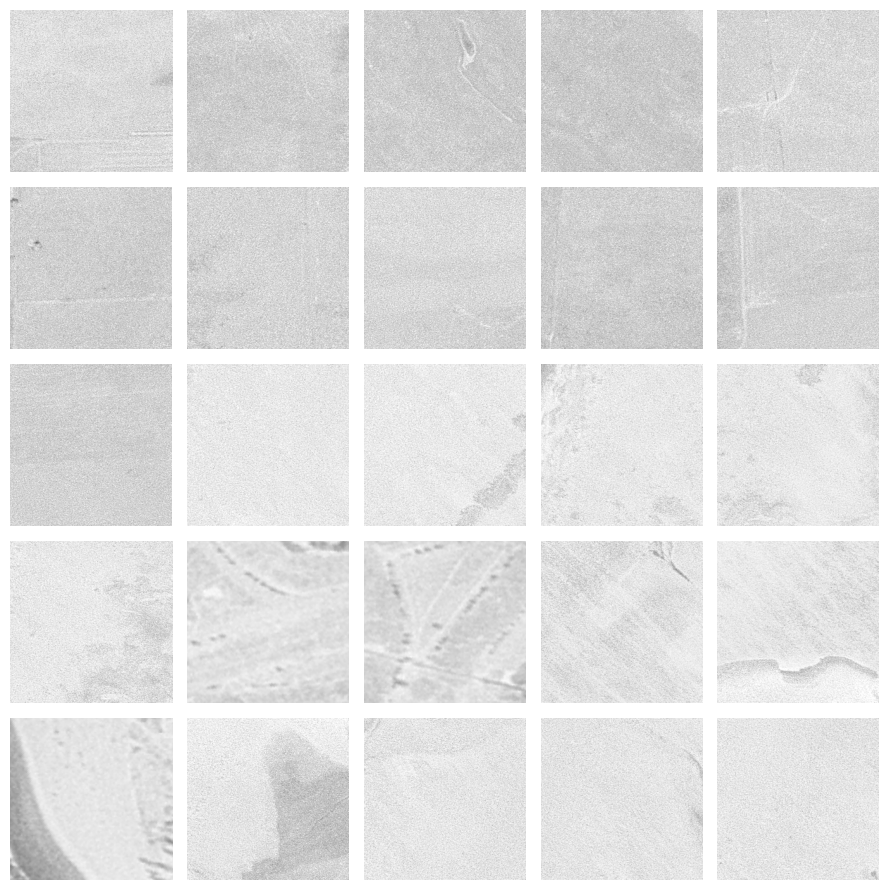

In [272]:
plot_filter(low_images)

In [ ]:
ds_meta.close()

## Model Storage

Save and load

In [ ]:
torch.save(mae.state_dict(), 'aermae.pth')

In [ ]:
mae = torch.load('aermae.pth')

## Cleanup

In [22]:
ds_train.close()
ds_val.close()
ds_test.close()